<img src="LOGO_FINANCE_GREEN.png" width=30%>

## Use Case Quinten - Thomas Doucet

Problème d’attrition de la clientèle d'une banque de détail

### PLAN : 

* Importation & Exploration des données
* Relations entre variables 
* Correlations & imputation valeurs manquantes
    * Variables non anonymes
    * Variables anonymes
* Modéles :
    * LogisticRegression
    * DecisionTree
    * RandomForest
    * Boosting
* Analyse des résultats


In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import time
import scipy.stats as ss

In [2]:
df=pd.read_csv('dataset.csv',sep=';')
df.head()

,id_client,genre,espace_client_web,assurance_vie,banque_principale,anciennete_mois,compte_epargne,credit_autres,cartes_bancaires,compte_courant,...,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,branche,churn
0,3463,H,0.0,non,non,37.0,oui,consommation,medium,oui,...,13545.535937,12243.785415,12140.590245,9013.777747,11604.261036,16390.415593,14631.204899,23988.305931,NORD-OUEST,non
1,1869,H,0.0,oui,oui,72.0,oui,consommation,premium,inconnu,...,14014.989673,15508.546834,17547.988381,15470.524076,17537.628474,17410.472648,21258.908987,21554.411100,NORD-OUEST,non
2,3760,H,0.0,non,non,3.0,oui,NaN,medium,non,...,17239.846026,19479.322456,21343.802381,24084.291026,25823.493343,25839.829752,25587.814976,29736.376226,NORD-OUEST,non
3,3820,H,1.0,oui,non,72.0,oui,consommation,medium,oui,...,9229.470887,11935.244779,11014.748509,11791.353542,16354.051367,15449.967495,21149.789933,29211.314803,NORD-OUEST,non
4,1463,F,0.0,non,non,4.0,oui,permanent,medium,non,...,9008.641700,5875.342745,6101.742525,8026.508871,10361.246523,10575.966610,6714.625315,9101.978017,NORD-OUEST,oui


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 63 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id_client                     7043 non-null   int64  
 1   genre                         6915 non-null   object 
 2   espace_client_web             6916 non-null   float64
 3   assurance_vie                 6912 non-null   object 
 4   banque_principale             6921 non-null   object 
 5   anciennete_mois               6909 non-null   float64
 6   compte_epargne                6894 non-null   object 
 7   credit_autres                 6916 non-null   object 
 8   cartes_bancaires              6893 non-null   object 
 9   compte_courant                6896 non-null   object 
 10  espace_client                 6912 non-null   object 
 11  PEA                           6897 non-null   object 
 12  assurance_auto                6907 non-null   object 
 13  ass

In [4]:
df.describe([0.05,0.25,0.50,0.75,0.90,0.95,0.99])

,id_client,espace_client_web,anciennete_mois,agios_6mois,age,var_0,var_1,var_2,var_3,var_4,...,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38
count,7043.000000,6916.000000,6909.000000,6896.000000,6889.000000,6893.000000,6905.000000,6885.000000,6896.000000,6905.000000,...,6899.000000,6887.000000,6891.000000,6896.000000,6909.000000,6901.000000,6912.000000,6908.000000,6895.000000,6888.000000
mean,3521.000000,0.162666,32.378926,64.761615,43.608506,7179.987046,9181.184842,11216.801336,13181.565491,15226.615127,...,9785.838628,11068.392722,12451.917950,13847.487586,15330.769094,16951.694375,18658.079824,20385.900574,22273.316999,24236.491341
std,2033.283305,0.369088,24.572971,30.101904,16.215077,5810.200728,6146.097003,6473.621085,6755.778274,7027.169215,...,5557.064049,6048.259593,6548.008325,7052.226589,7588.094743,8077.431652,8687.004053,9186.926461,9830.595029,10422.086601
min,0.000000,0.000000,0.000000,18.250000,20.000000,0.767658,-4241.785944,-3519.347763,-3913.768064,-5409.713059,...,-11.430930,31.496118,51.786562,258.614091,474.166678,1050.553067,1401.075175,1704.972375,1924.631757,2703.861155
5%,352.100000,0.000000,1.000000,19.650000,22.000000,530.130590,1494.816283,2573.997167,3865.406163,5203.188164,...,2867.804644,3385.592989,4007.262636,4624.529589,5432.315024,6251.446847,6972.471454,7916.943635,8998.597952,9924.257796
25%,1760.500000,0.000000,9.000000,35.500000,31.000000,2711.797553,4684.731756,6636.687807,8445.162191,10366.064325,...,5863.700722,6822.771605,7808.787487,8856.463378,9925.688827,11192.255014,12495.574275,13819.139453,15285.970426,16756.046193
50%,3521.000000,0.000000,29.000000,70.325000,40.000000,5761.948333,7932.505258,10077.513755,12216.321177,14357.736653,...,8795.690408,9991.322358,11349.583083,12688.437278,14165.118676,15661.366988,17348.631325,19163.547474,20858.094755,22798.226057
75%,5281.500000,0.000000,55.000000,89.900000,54.000000,10136.583353,12472.797039,14815.834866,16987.139371,19319.195330,...,12498.175513,14106.366808,15778.954065,17538.748692,19411.026782,21410.796020,23378.954041,25524.326086,27639.687915,30000.951224
90%,6337.800000,1.000000,69.000000,102.650000,67.000000,15469.809418,17666.036974,19935.718673,22072.788988,24377.806206,...,16827.303131,19031.328687,21081.077020,23020.498151,25236.657855,27572.531192,29957.721541,32564.746432,35176.769624,37699.259932
95%,6689.900000,1.000000,72.000000,107.412500,75.000000,18857.881469,21397.322385,23680.068748,25793.155736,28105.056166,...,20107.839894,22372.875230,24579.598985,26979.451949,29477.579202,31653.606959,34519.716274,36803.369798,40285.486394,43045.914044


In [5]:
# Séparation des variables numériques et catégorielles
num=[] # Variables numériques
cat=[] # Variables catégorielles
var_anonyme=[] # Variables anonymes
var_non_anonyme=[] # Variables non anonymes
target='churn'
for col in df.columns:
    if not col in ['id_client','churn']:
        if df.dtypes[col]==object or df[col].nunique() <=11:
            cat.append(col)
        else:
            num.append(col)
        if col.startswith('var_'):
            var_anonyme.append(col)
        else:
            var_non_anonyme.append(col)
        

print('\033[1m' +'Variables numériques :'+ '\033[0m',end='\n\n')    
print(num,end='\n\n')
print('\033[1m' +'Variables catégorielles :'+ '\033[0m',end='\n\n') 
print(cat,end='\n\n')
print('\033[1m' +'Variables Anonymes :'+ '\033[0m',end='\n\n')    
print(var_anonyme,end='\n\n')
print('\033[1m' +'Variables Non Anonymes :'+ '\033[0m',end='\n\n') 
print(var_non_anonyme,end='\n\n')

Variables numériques :

['anciennete_mois', 'agios_6mois', 'age', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4', 'var_5', 'var_6', 'var_7', 'var_8', 'var_9', 'var_10', 'var_11', 'var_12', 'var_13', 'var_14', 'var_15', 'var_16', 'var_17', 'var_18', 'var_19', 'var_20', 'var_21', 'var_22', 'var_23', 'var_24', 'var_25', 'var_26', 'var_27', 'var_28', 'var_29', 'var_30', 'var_31', 'var_32', 'var_33', 'var_34', 'var_35', 'var_36', 'var_37', 'var_38']

Variables catégorielles :

['genre', 'espace_client_web', 'assurance_vie', 'banque_principale', 'compte_epargne', 'credit_autres', 'cartes_bancaires', 'compte_courant', 'espace_client', 'PEA', 'assurance_auto', 'assurance_habitation', 'credit_immo', 'type', 'compte_titres', 'methode_contact', 'interet_compte_epargne_total', 'segment_client', 'branche']

Variables Anonymes :

['var_0', 'var_1', 'var_2', 'var_3', 'var_4', 'var_5', 'var_6', 'var_7', 'var_8', 'var_9', 'var_10', 'var_11', 'var_12', 'var_13', 'var_14', 'var_15', 'var_16', 'var_17', 'var

In [6]:
for var in cat+[target]:
    print(var,':')
    print(df[var].value_counts(),end='\n\n')

genre :
H    3499
F    3416
Name: genre, dtype: int64

espace_client_web :
0.0    5791
1.0    1125
Name: espace_client_web, dtype: int64

assurance_vie :
non    3578
oui    3334
Name: assurance_vie, dtype: int64

banque_principale :
non    4854
oui    2067
Name: banque_principale, dtype: int64

compte_epargne :
oui    6226
non     668
Name: compte_epargne, dtype: int64

credit_autres :
permanent       3330
consommation    2916
bail             670
Name: credit_autres, dtype: int64

cartes_bancaires :
medium     3029
basic      2375
premium    1489
Name: cartes_bancaires, dtype: int64

compte_courant :
non        3424
oui        1981
inconnu    1491
Name: compte_courant, dtype: int64

espace_client :
non        3027
oui        2392
inconnu    1493
Name: espace_client, dtype: int64

PEA :
non        3034
oui        2377
inconnu    1486
Name: PEA, dtype: int64

assurance_auto :
non        3402
oui        2002
inconnu    1503
Name: assurance_auto, dtype: int64

assurance_habitation :
non  

In [7]:
# Elements présents dans la variables "interet_compte_epargne_total" semblent être numériques et non catégorielles
# comme son type de colonne le laisserait penser

# On corrige cette colonne
def convert_to(var,letype=float):
    if type(var)==letype:
        return var
    elif var != ' ':
        return float(var)
    
df['interet_compte_epargne_total_float']=df.apply(
            lambda x : convert_to(x['interet_compte_epargne_total'],letype=float),
    axis=1)

cat.remove('interet_compte_epargne_total')
num.append('interet_compte_epargne_total_float')
var_non_anonyme.remove('interet_compte_epargne_total')
var_non_anonyme.append('interet_compte_epargne_total_float')

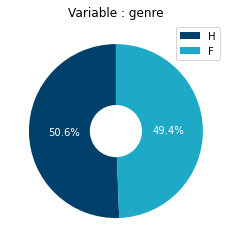

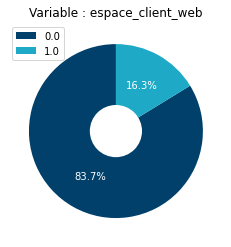

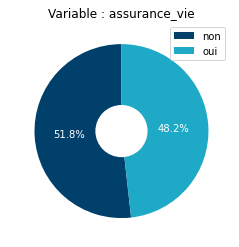

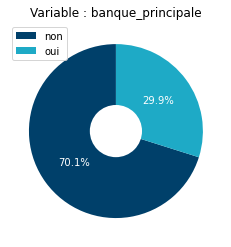

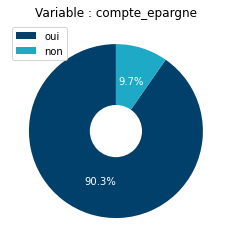

...

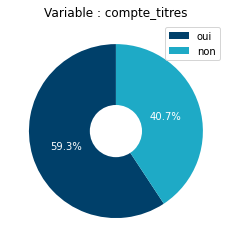

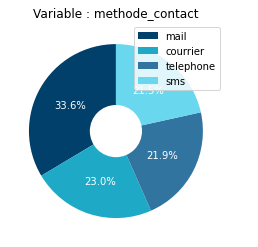

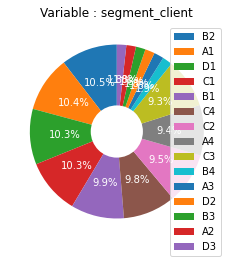

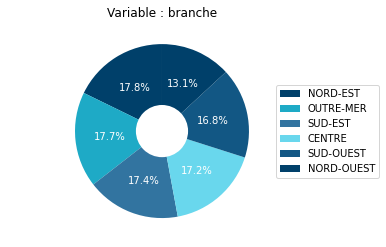

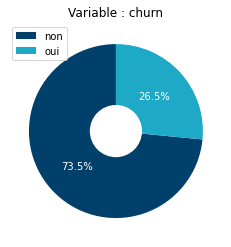

In [8]:
colors = ['#00406a','#1eaac6','#3274a0','#69d7ed','#125784'] #,'#c3f2fcf']
for var in cat+['churn']:
    count = (df[var].value_counts()).values
    label=(df[var].value_counts()).index
    prop=count/df.shape[0]
    if len(label)<10:
        plt.pie(count,labels=label,colors=colors,autopct='%1.1f%%',startangle=90,textprops=dict(color="w"))
        plt.legend(loc='best')
    else:
        plt.pie(count,labels=label,autopct='%1.1f%%',startangle=90,textprops=dict(color="w"))
        plt.legend(loc='upper right')
    if var == 'branche':
        plt.legend(loc="center left",bbox_to_anchor=(1, 0, 0.5, 1))
    centre_circle = plt.Circle((0,0),0.30,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    plt.title('Variable : {}'.format(var))
    plt.show()

### Le churn moyen sur la base est de 26.5%

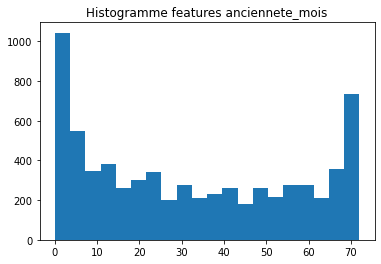

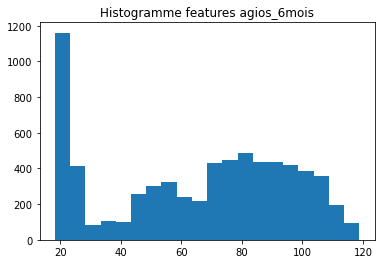

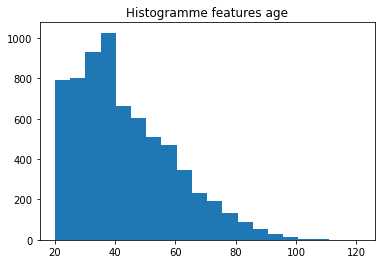

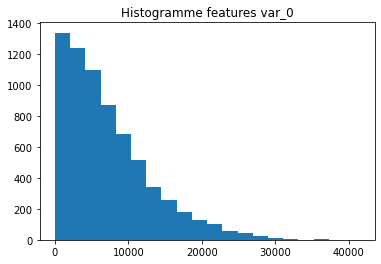

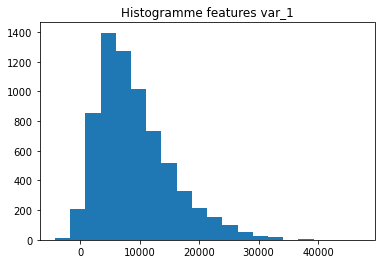

...

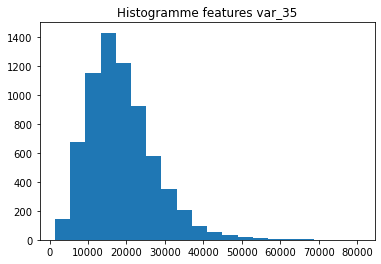

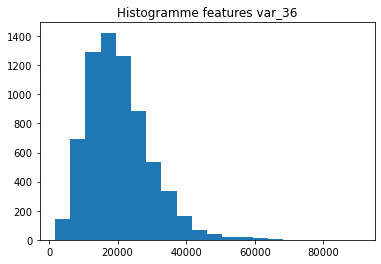

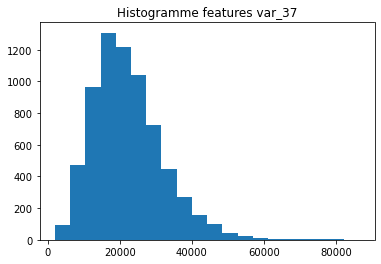

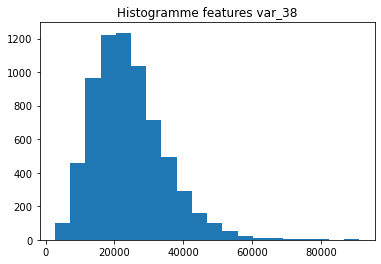

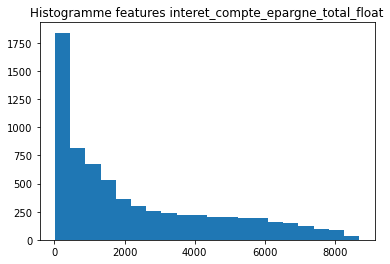

In [9]:
%matplotlib inline
for col_num in num:
    plt.hist(df[col_num],bins=20)
    plt.title('Histogramme features {}'.format(col_num))
    plt.show()

In [145]:
# Absence de valeurs aberrantes au sein des donnéées numériques

### Data-Viz sur données non-anonymes

In [10]:
### Interaction Variables Non anonymes

# Features we want to keep in our model
numeric_features = num
categorical_features = cat
data=df.copy()

# On convertit le variable 'churn' en integer
data['target']=(data[target]=='oui')
data['target']=data['target'].astype(int)

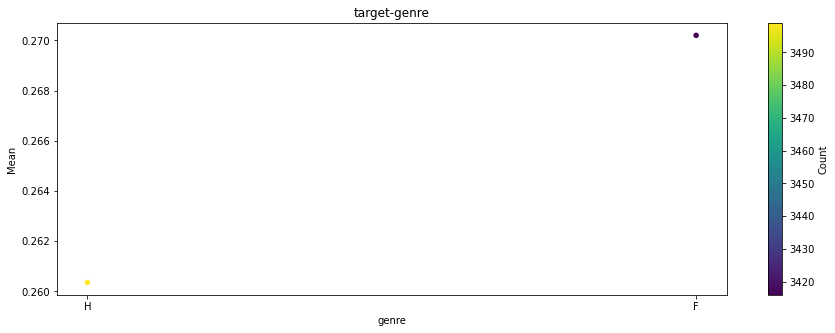

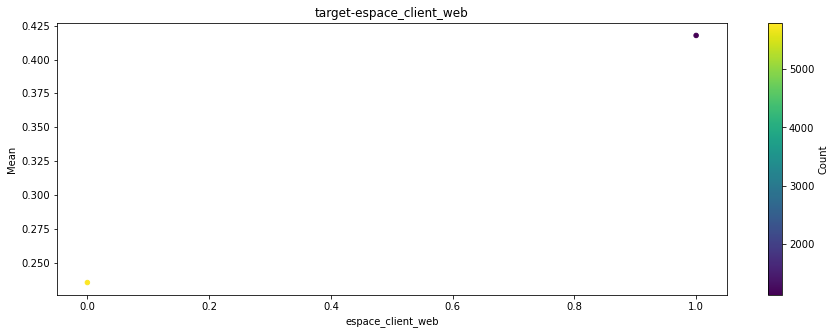

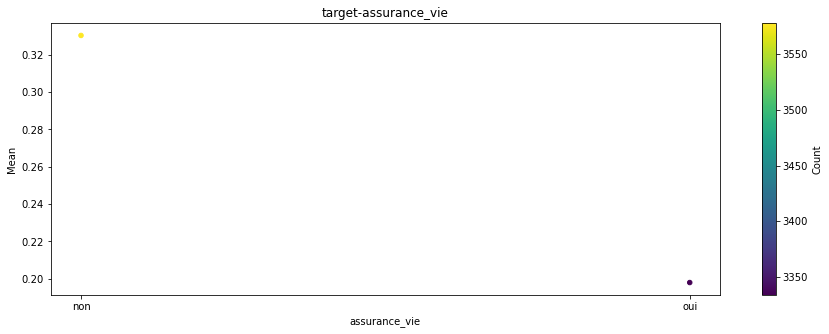

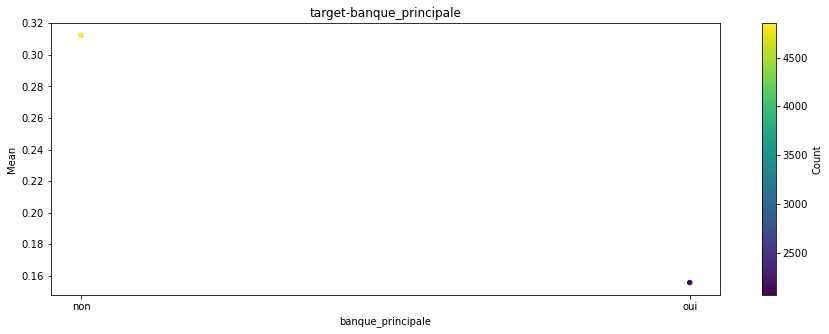

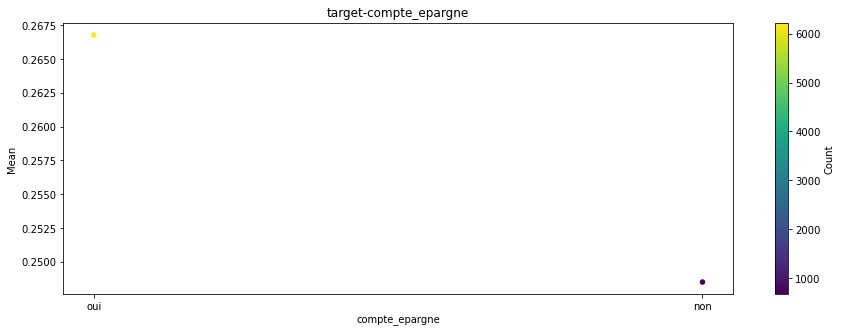

...

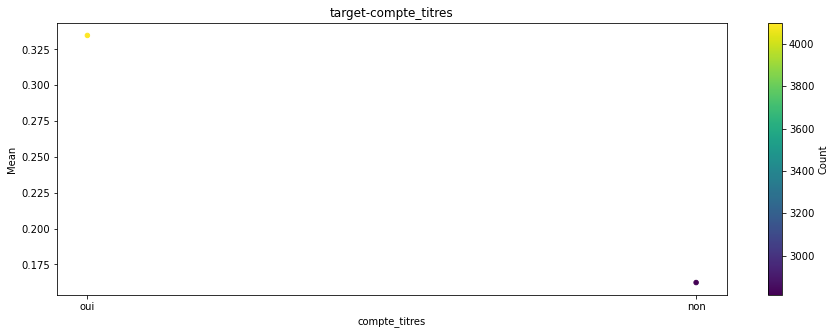

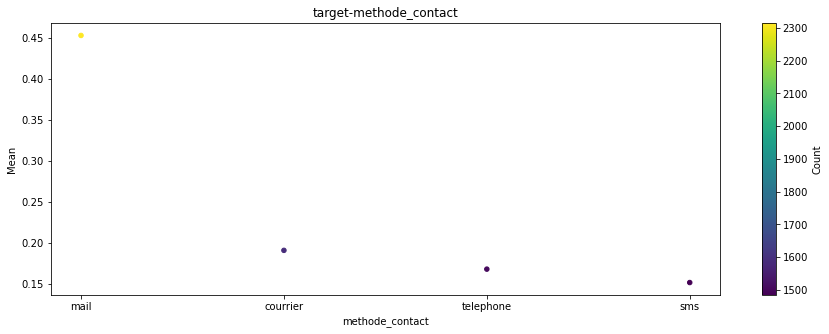

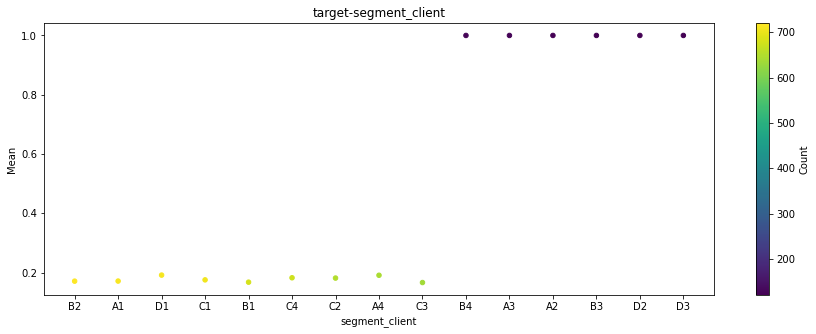

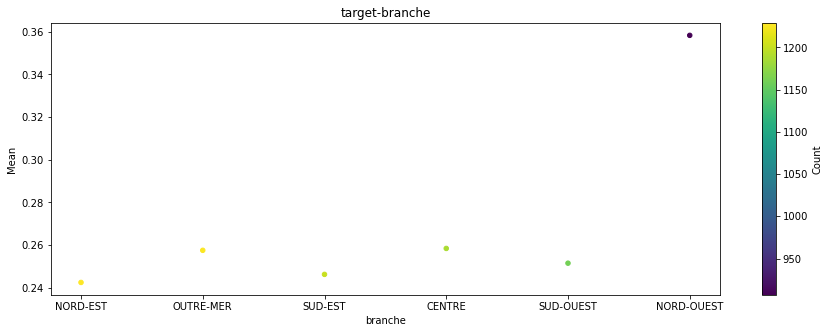

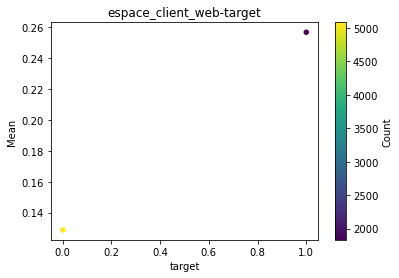

In [11]:
#DATA ANALYSIS
categorical_features_plt = cat
numeric_features_plt  = ['espace_client_web']

analysis_ic = {}
analysis_nf = {}

for i in ['target']:
    for j in categorical_features_plt :
        analysis_ic[i +'-'+ j] = pd.DataFrame({'Mean': data.groupby(j).mean()[i], 'Count' : data.groupby(j).count()[i]}).sort_values(by=['Count'],ascending=False)

for i in numeric_features_plt :
    for j in ['target']:
        analysis_nf[i +'-'+ j] = pd.DataFrame({'Mean': data.groupby(j).mean()[i], 'Count' : data.groupby(j).count()[i]}).sort_values(by=['Count'],ascending=False)

#CHARTS
for i in ['target']:
    for j in categorical_features_plt:
        analysis_ic[i +'-'+ j].reset_index().plot.scatter(x=str(j),y='Mean',c='Count',colormap='viridis',title = i+'-'+j,figsize=(15,5),sharex=False)
        plt.show()

for i in numeric_features_plt:
    for j in ['target']:
       analysis_nf[i +'-'+ j].reset_index().plot.scatter(x=str(j),y='Mean',c='Count',colormap='viridis',title = i+'-'+j,sharex=False)
       plt.show()
        

In [12]:
# Mêmes Clients avec label "inconnus" pour les différentes catégories
oui_non_na=['assurance_vie','banque_principale','compte_epargne','compte_courant','espace_client','PEA',
           'assurance_auto','assurance_habitation','credit_immo','compte_titres']

df[df['compte_courant']=='inconnu'][oui_non_na]

,assurance_vie,banque_principale,compte_epargne,compte_courant,espace_client,PEA,assurance_auto,assurance_habitation,credit_immo,compte_titres
1,oui,oui,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,non
13,oui,oui,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,oui
15,non,non,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,non
17,oui,oui,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,oui
23,oui,oui,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,non
...,...,...,...,...,...,...,...,...,...,...
7019,non,non,oui,inconnu,inconnu,inconnu,inconnu,NaN,inconnu,NaN
7020,non,non,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,oui
7029,non,non,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,oui
7036,oui,oui,oui,inconnu,inconnu,inconnu,inconnu,inconnu,inconnu,oui


In [13]:
for c in cat :
    print(analysis_ic['target'+'-'+ c])

           Mean  Count
genre                 
H      0.260360   3499
F      0.270199   3416
                       Mean  Count
espace_client_web                 
0.0                0.235193   5791
1.0                0.417778   1125
                   Mean  Count
assurance_vie                 
non            0.330352   3578
oui            0.197960   3334
                       Mean  Count
banque_principale                 
non                0.312320   4854
oui                0.155781   2067
                    Mean  Count
compte_epargne                 
oui             0.266784   6226
non             0.248503    668
                   Mean  Count
credit_autres                 
permanent      0.251652   3330
consommation   0.287037   2916
bail           0.250746    670
                      Mean  Count
cartes_bancaires                 
medium            0.420271   3029
basic             0.189474   2375
premium           0.072532   1489
                    Mean  Count
compte_courant     

### Obervations :

Variables catégorielles sur lesquelles une discrimiation peut être fait au niveau du churn:

* Clients n'ayant pas assurance vie, compte courant, d'espace client, de PEA sont plus susceptibles de quitter la banque

*  En général les modalités "inconnu" sont moins propices aux churn (PEA, espace client, compte courant, assurance-auto, assurance habitation, credit immo)

* Les clients dont la méthode de contact sont les mails ont un taux de départ de 45% contre des taux inférieur à 20% pour le courrier, téléphone et sms)

* Type de client : les pros ont un tendance de 43% à partir contre 11% pour les clients perso.

* Segmentation client : (variable la plus corrélée au churn) présente un taux de churn de 100% pour les segmentations B4, A3, A2, B3, D2 et D3 contre environ 20% pour les autres segments : Une question se pose sur la construction de cette  feature (intégration de la target dedans ?)

* Au niveau des branches : 
    * "Nord Ouest" qui a le plus faible total de clients a un taux de 36%
    * Les autres brance-hes sont des taux  compris entre 24 et 26%



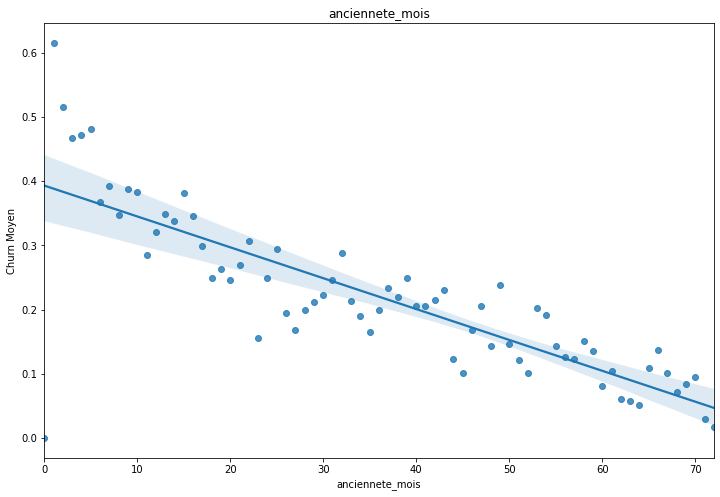

<ipython-input-14-b9ffe1a9ba5b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Quantile_rank']=pd.qcut(data[col], nb_quantile, labels = False).values


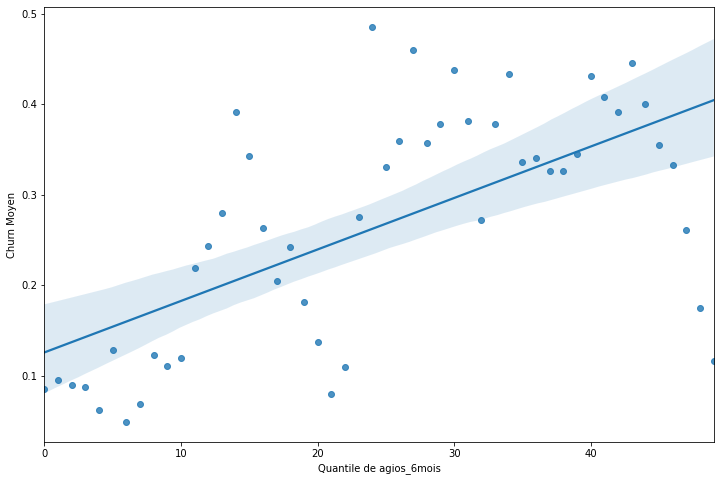

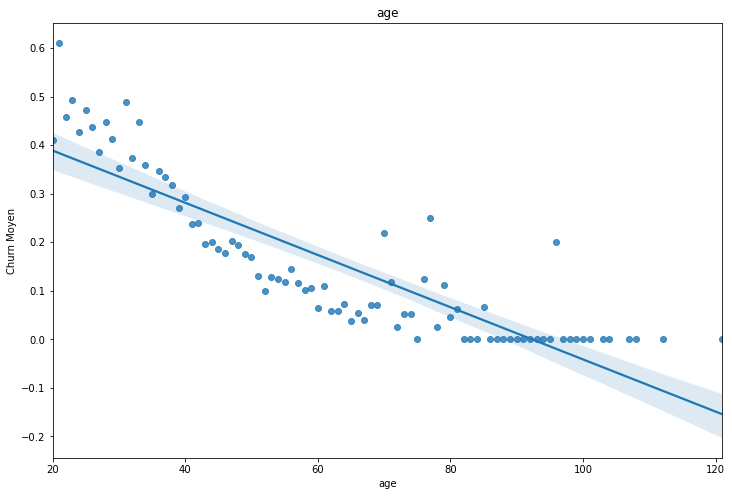

<ipython-input-14-b9ffe1a9ba5b>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Quantile_rank']=pd.qcut(data[col], nb_quantile, labels = False).values


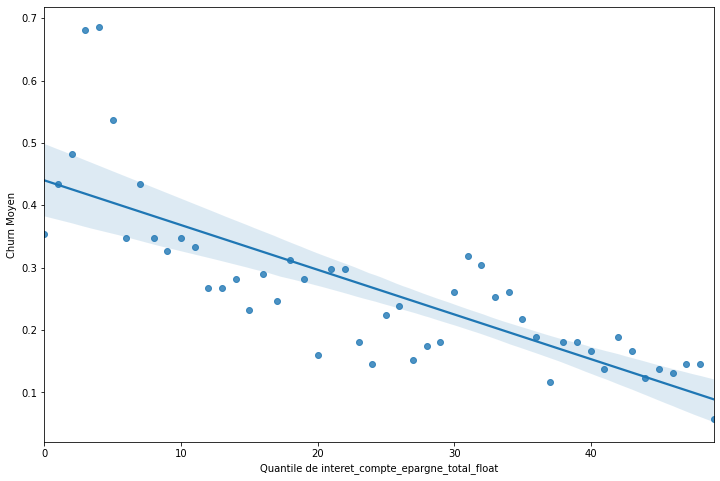

In [14]:
num_reg=['anciennete_mois','agios_6mois','age','interet_compte_epargne_total_float']
nb_quantile=50
for col in num_reg:
    plt.figure(figsize = (12, 8))
    plt.ylabel('Churn Moyen')
    if col=="agios_6mois" or col=='interet_compte_epargne_total_float':
        test=data[['agios_6mois','target']]
        test['Quantile_rank']=pd.qcut(data[col], nb_quantile, labels = False).values
        quantile_agios=test.groupby('Quantile_rank').mean()['target']
        sns.regplot(x = quantile_agios.index, y = quantile_agios.values)
        plt.xlabel('Quantile de ' +col)
    else:
        plt.title(col)
        num_churn = data.groupby(col)['target'].describe()
        sns.regplot(x = num_churn.index, y = num_churn["mean"].values)
        
    plt.show()

### Obervations :

Variables numériques & Churn:
* relation décroissante pour ancienneté, age et intérêt compte épargne : Observation logique car l'ancienneté et bonne relation avec sa banque vont de paires. Quelqu'un percevant des intérets sur son épargne important est signe que son compte vie (ou plutôt rempli). En ce qui concerne l'âge, les clients jeunes ont plus tendance à changer de banques que des personnes agées.
* relation croissante avec les agios, plus une personne paie d'agios et moins la relation est bonne. Dans le cas de beaucoup d'agios on peut imaginer que ce soit la banque qui cloture le compte.

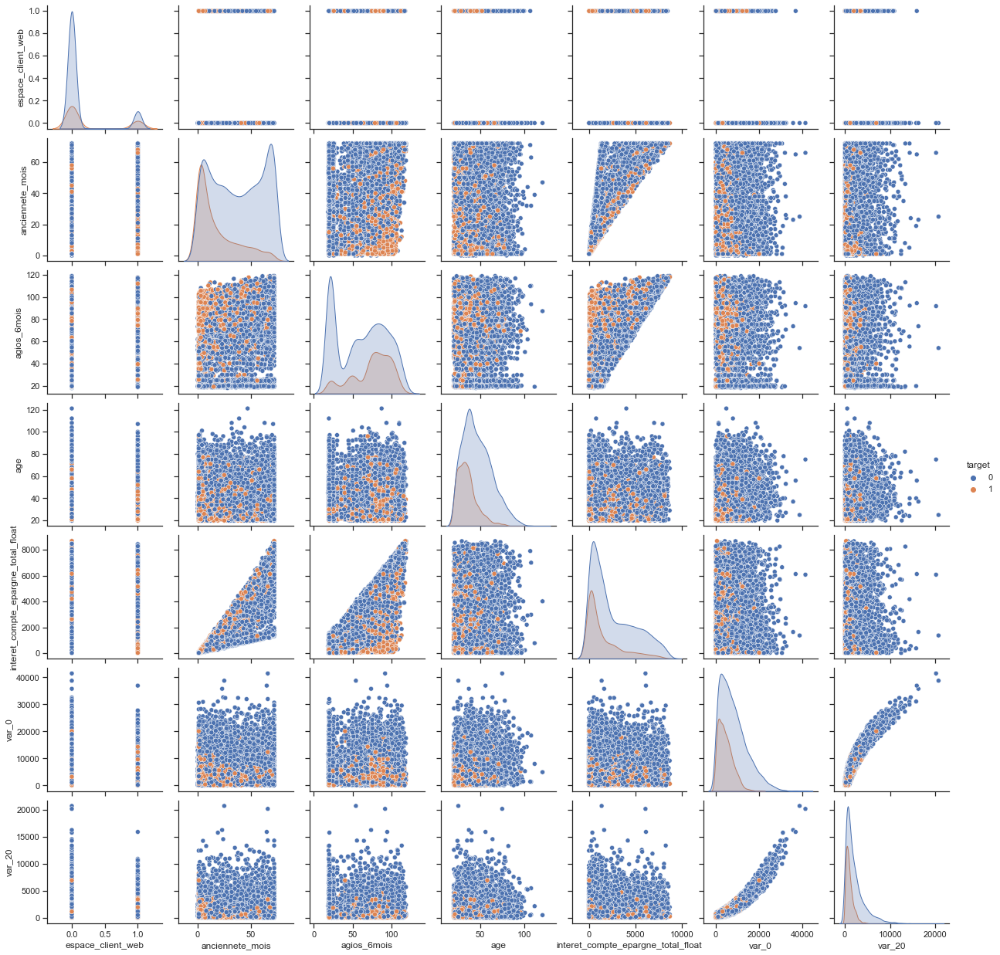

In [15]:
# Pairplot sur données numériques non anonymes + var_0 et var_20
import seaborn as sns
sns.set_theme(style="ticks")
sns.color_palette("mako", as_cmap=True)
sns.pairplot(data[var_non_anonyme+['target','var_0','var_20']], hue="target")

In [16]:
# LabelEncoder pour les features catégorielles
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
df_pairplot=data.copy()
new_cat=[]
for col in cat:
    le.fit(df_pairplot[col])
    df_pairplot[col+'_encode']=le.transform(df_pairplot[col])
    new_cat.append(col+'_encode')

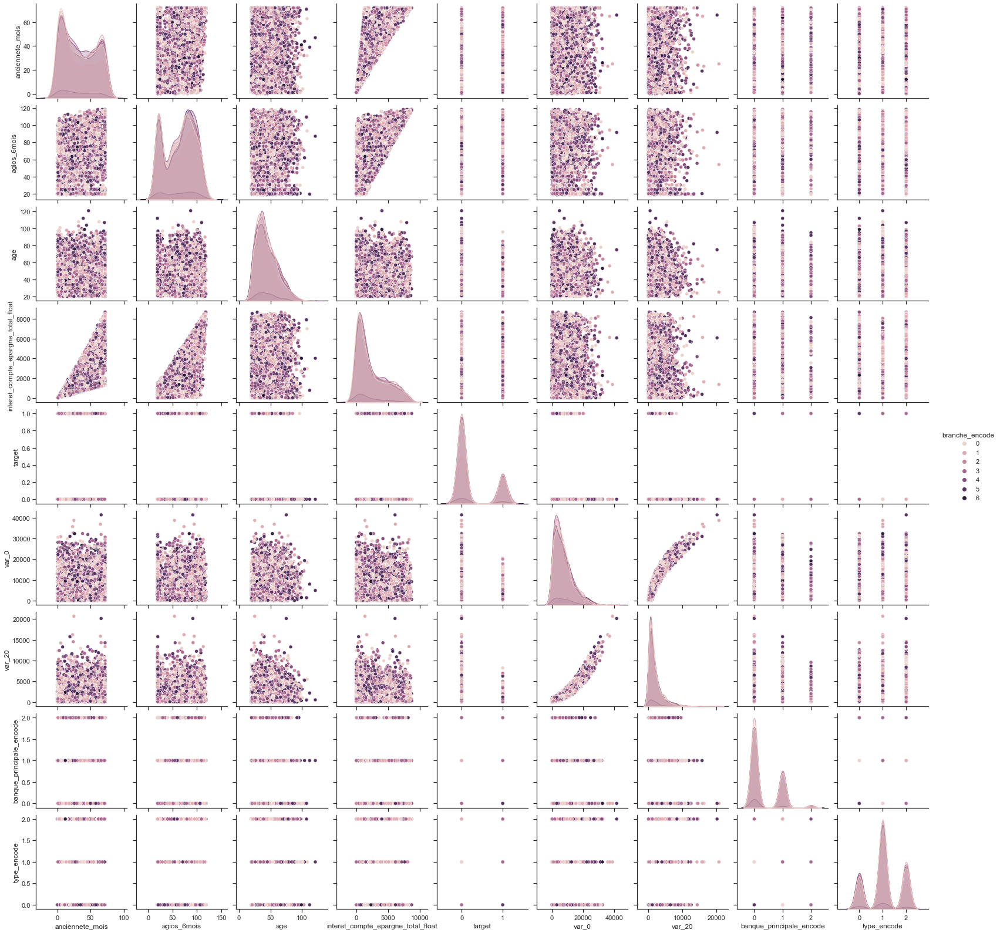

In [17]:
#Pairplot : couleur en fonction de la branche
toplot=num_reg+['target','var_0','var_20','banque_principale_encode','compte_courant','type_encode','branche_encode']
sns.set_theme(style="ticks")
sns.pairplot(df_pairplot[toplot], hue="branche_encode")

In [18]:
# Pas d'infos particulière sur les interactions entre features en fonction de la branche

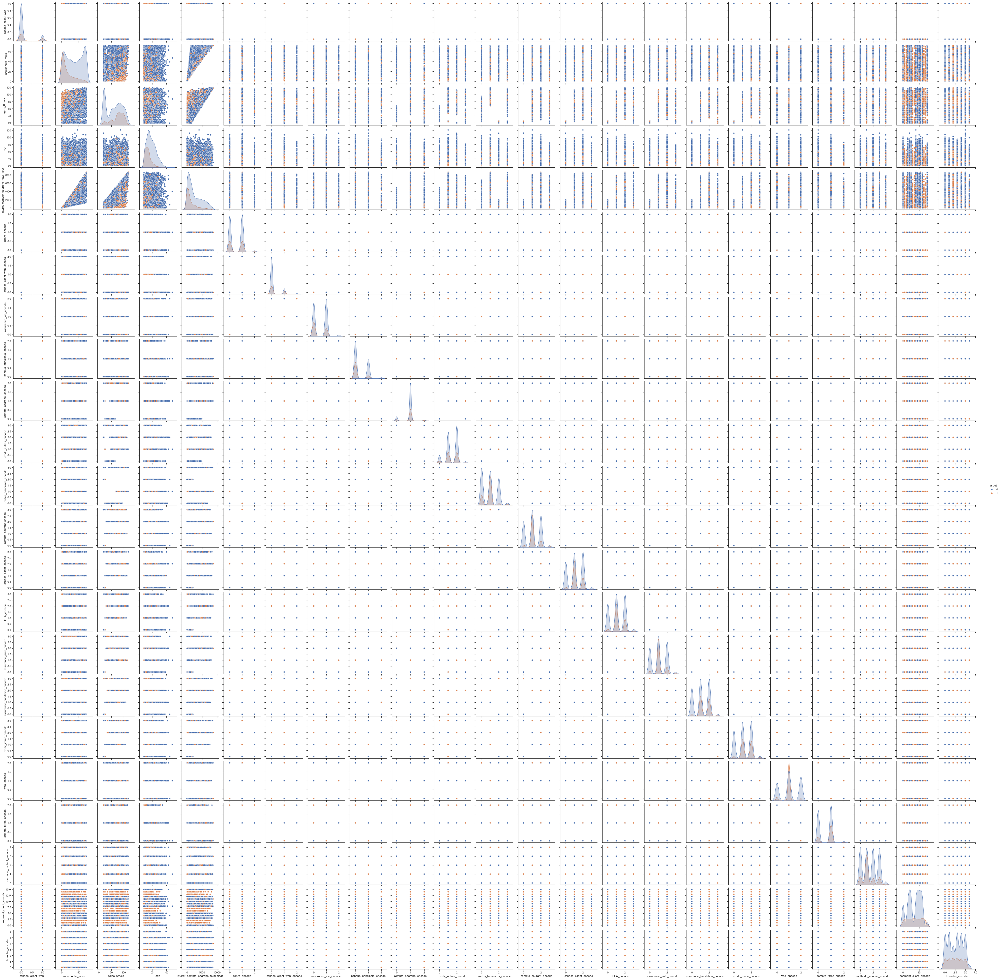

In [19]:
sns.set_theme(style="ticks")
sns.pairplot(df_pairplot[var_non_anonyme+['target']+new_cat], hue="target")

In [20]:
# Difficile à interpréter entre variables catégorielle. Couleur du point est la classe majoritaire
# Pas de mise en évidence d'un fort taux de churner

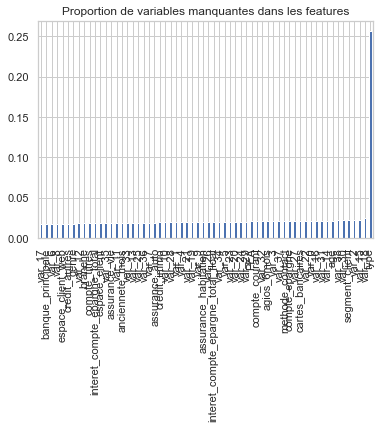

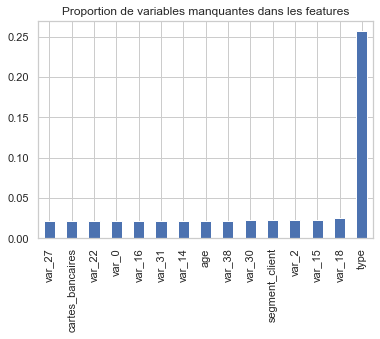

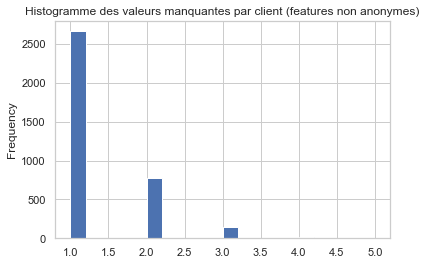

In [21]:
sns.set_style("whitegrid")
missing = data.isnull().sum()
missing = missing[missing > 0]/df[var_anonyme].shape[0]
missing.sort_values(inplace=True)
plt.title('Proportion de variables manquantes dans les features')
missing.plot.bar()
#plt.xticks(rotation=45)
plt.show()

#Affiachage des 10 features avec le plus de valeurs manquantes
max_f=15
sns.set_style("whitegrid")
missing = data.isnull().sum()
missing = missing[missing > 0]/df[var_anonyme].shape[0]
missing.sort_values(inplace=True)
plt.title('Proportion de variables manquantes dans les features')
missing[-max_f:].plot.bar()
plt.show()

sns.set_style("whitegrid")
missing = df[var_non_anonyme].transpose().isnull().sum()
missing = missing[missing > 0]
#/df[var_anonyme].shape[1]
#missing.sort_values(inplace=True)
plt.title('Histogramme des valeurs manquantes par client (features non anonymes)')
missing.plot.hist(bins=20)
plt.show()


In [22]:
# Pas de structure particulière au sein des clients pour les valeurs manquantes

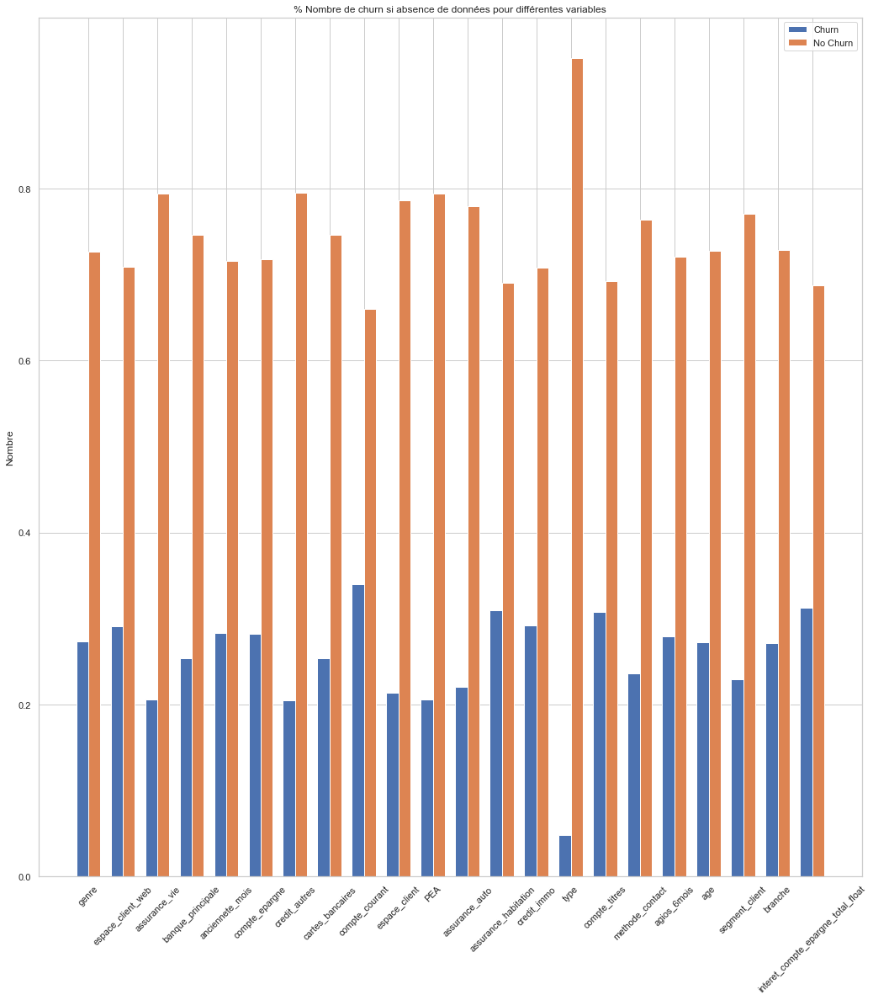

In [23]:
#S'assurer que la présence de valeur manquante ne soit pas discriminant vis à  vis de la target
Oui=[]
Non=[]
for var in var_non_anonyme:
    dftemp=data[data[var].isna()][target].value_counts()
    if 'oui' in dftemp.index:
        Oui.append(dftemp['oui']/dftemp.sum())
        Non.append(1-dftemp['oui']/dftemp.sum())
    else:
        Oui.append(0)
        Non.append(1)
    
x = np.arange(len(var_non_anonyme))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(15, 15))
rects1 = ax.bar(x - width/2, Oui, width, label='Churn')
rects2 = ax.bar(x + width/2, Non, width, label='No Churn')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Nombre')
ax.set_title('% Nombre de churn si absence de données pour différentes variables')
ax.set_xticks(x)
ax.set_xticklabels(var_non_anonyme)
ax.legend()


fig.tight_layout()
plt.xticks(rotation=45)
plt.show()

### Commentaires:
La présence de valeurs manquantes au sein des variables n'est pas discriminant sur le fait que le client quitte la banque. Néanmoins on peut voir un faible taux de churn pour les clients "sans type" mais cela revient à l'observation vu précédemment que les clients de type 'inconnu' pour certaines features avaient un taux de churn faible

In [24]:
# On regarde si l'absence d'interet provient du fait que le client n'ait pas de compte epargne
print('Nombre de clients avec compte epargne pour clients sans interets')
data[data['interet_compte_epargne_total_float'].isnull()]['compte_epargne'].value_counts()

Nombre de clients avec compte epargne pour clients sans interets


oui    130
non     10
Name: compte_epargne, dtype: int64

### Valeurs manquantes:

Le taux de NA est relativement stable, autour de 2 % hormis pour type.
Dans la mesure où le label "inconnu" est déjà présent dans plusieurs variables catégorielles mais que ce label est fortement discrimant au niveau du churn (les clients inconnus le sont pour plusieurs variables).On imputera alors alors variables catégorielles par "Non défini"
* Pour les variables numériques : la structure des variables anonymisées nécessitera un traitement particulier
* Pour le reste des valeurs numériques non anonymes :
    * ages --> moyenne
    * agios --> moyenne
    * ancienneté_mois --> moyenne
    * intéret_compte_epargne_total_float --> moyenne

### Etudes des correlations

<AxesSubplot:>

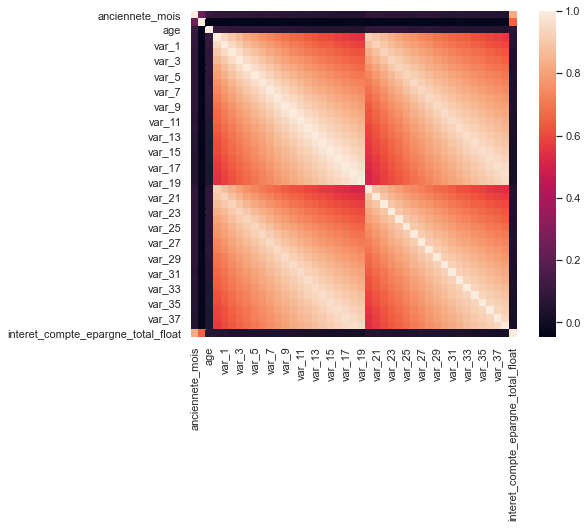

In [25]:
#Verification of features correlation on numerical variables
corr_matrix = df[numeric_features].corr()
ec_corr = corr_matrix.loc[corr_matrix.index,corr_matrix.columns]

f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(ec_corr, mask=np.zeros_like(ec_corr, dtype=np.bool), square=True, ax=ax)


In [26]:
corr_matrix

,anciennete_mois,agios_6mois,age,var_0,var_1,var_2,var_3,var_4,var_5,var_6,...,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,interet_compte_epargne_total_float
anciennete_mois,1.000000,0.248049,0.115301,0.094931,0.091862,0.083233,0.080782,0.081813,0.078020,0.074257,...,0.069341,0.063486,0.070477,0.065811,0.059823,0.059916,0.056196,0.052982,0.053379,0.825694
agios_6mois,0.248049,1.000000,-0.047652,-0.042255,-0.039620,-0.043967,-0.040192,-0.040129,-0.043469,-0.040606,...,-0.034502,-0.039396,-0.029636,-0.027327,-0.033761,-0.032788,-0.032237,-0.034894,-0.033437,0.653055
age,0.115301,-0.047652,1.000000,0.101858,0.095678,0.087549,0.085600,0.080708,0.082395,0.077141,...,0.064792,0.064584,0.056804,0.053981,0.058408,0.055740,0.051851,0.046745,0.048772,0.069408
var_0,0.094931,-0.042255,0.101858,1.000000,0.946395,0.901050,0.861757,0.823675,0.794062,0.765118,...,0.682260,0.667666,0.648736,0.640486,0.617165,0.610094,0.591431,0.580434,0.567972,0.055622
var_1,0.091862,-0.039620,0.095678,0.946395,1.000000,0.950485,0.909676,0.870884,0.838371,0.807536,...,0.716178,0.696624,0.680309,0.669788,0.649880,0.641398,0.621577,0.613165,0.600124,0.051730
var_2,0.083233,-0.043967,0.087549,0.901050,0.950485,1.000000,0.956341,0.917160,0.882031,0.850943,...,0.749603,0.728411,0.710070,0.699640,0.682083,0.674052,0.652332,0.643013,0.630336,0.041266
var_3,0.080782,-0.040192,0.085600,0.861757,0.909676,0.956341,1.000000,0.960176,0.923195,0.890160,...,0.778668,0.756835,0.739922,0.725711,0.708528,0.698288,0.680525,0.669134,0.655165,0.039135
var_4,0.081813,-0.040129,0.080708,0.823675,0.870884,0.917160,0.960176,1.000000,0.962358,0.928227,...,0.803566,0.781478,0.762855,0.749465,0.730734,0.719826,0.701234,0.691486,0.677664,0.040739
var_5,0.078020,-0.043469,0.082395,0.794062,0.838371,0.882031,0.923195,0.962358,1.000000,0.964478,...,0.832679,0.810611,0.791894,0.778248,0.759462,0.747966,0.729418,0.717873,0.704875,0.035643
var_6,0.074257,-0.040606,0.077141,0.765118,0.807536,0.850943,0.890160,0.928227,0.964478,1.000000,...,0.855989,0.835583,0.815904,0.801216,0.782346,0.770659,0.752593,0.738633,0.726533,0.033036


In [27]:
var_anonyme_num=[]
var_non_anonyme_num=[]
for col in num:
    if col.startswith('var_'):
        var_anonyme_num.append(col)
    else:
        var_non_anonyme_num.append(col)

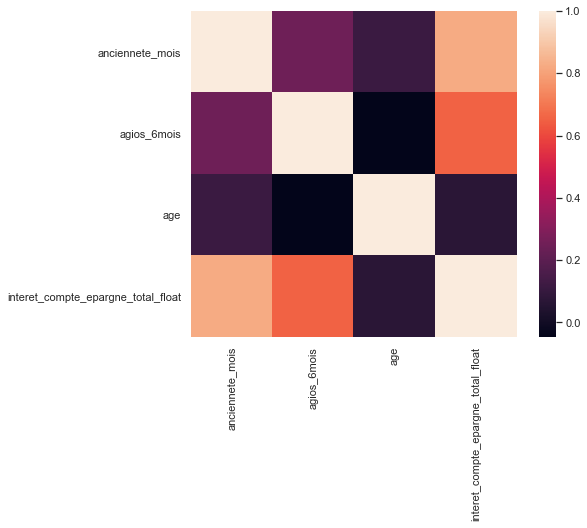

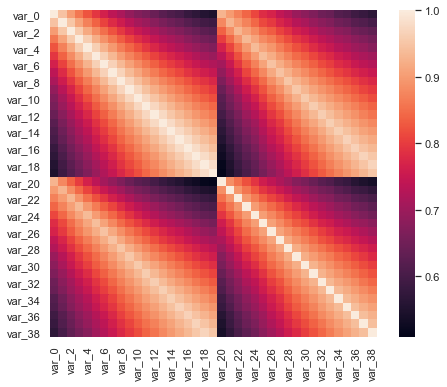

In [28]:
# Séparation des correlations si les variables sont anonymisées ou non
for var in [var_non_anonyme_num,var_anonyme_num]:
    f, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(ec_corr.loc[var,var], mask=np.zeros_like(ec_corr.loc[var,var], dtype=np.bool), square=True, ax=ax)


## Commentaires

Très forte correlation entre les variables anonymisées. On peut apercevoir 2 sous-groupe au sein de celles-ci. Le premier allant de var_0 à var_19 et l'autre allant de var_20 à var_38. Au vu de l'ordre de grandeur et de la correlation augmentant lorsque les indices se rappprochent on peut imaginer qu'il  s'agit de données temporelles comme  :
* le solde  bancaire 
* les flux débiteurs et créditeurs, etc ...

Afin de mieux appréhender ces variables nous allons les analyser d'un peu plus prêt.

Corrélation présente au sein des variables numériques non anonyme (dû à l'aspet temporel notamment) : 
* intérêts épargne total & ancienneté
* intérêts épargne total & agios 

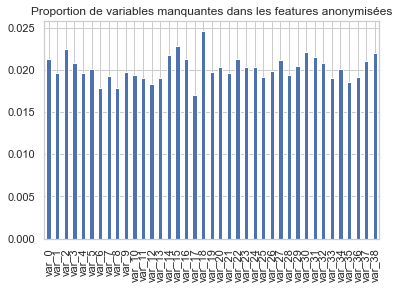

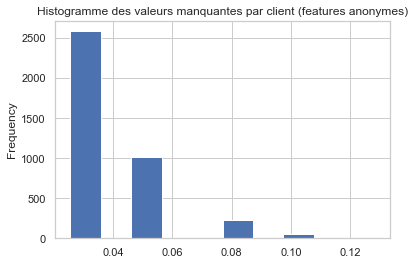

In [29]:
sns.set_style("whitegrid")
missing = df[var_anonyme].isnull().sum()
missing = missing[missing > 0]/df[var_anonyme].shape[0]
plt.title('Proportion de variables manquantes dans les features anonymisées')
missing.plot.bar()
plt.show()

sns.set_style("whitegrid")
missing = df[var_anonyme].transpose().isnull().sum()
missing = missing[missing > 0]/df[var_anonyme].shape[1]
plt.title('Histogramme des valeurs manquantes par client (features anonymes)')
missing.plot.hist()
plt.show()

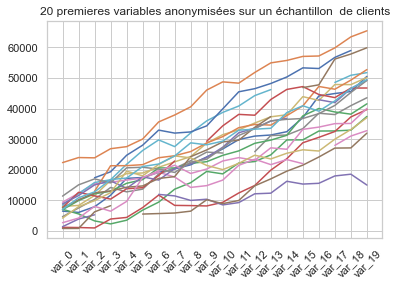

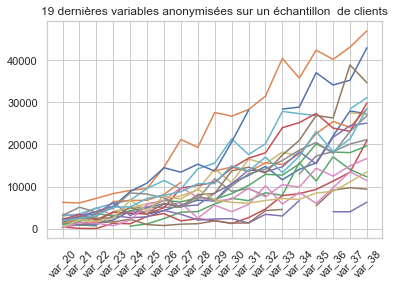

In [30]:
df_set=df[var_anonyme].sample(100) #Tirage aléatoire de clients

plt.plot(df_set[:20].transpose()[:20])
plt.xticks(rotation=45)
plt.title('20 premieres variables anonymisées sur un échantillon  de clients')
plt.show()

plt.plot(df_set[:20].transpose()[20:])
plt.xticks(rotation=45)
plt.title('19 dernières variables anonymisées sur un échantillon  de clients')
plt.show()


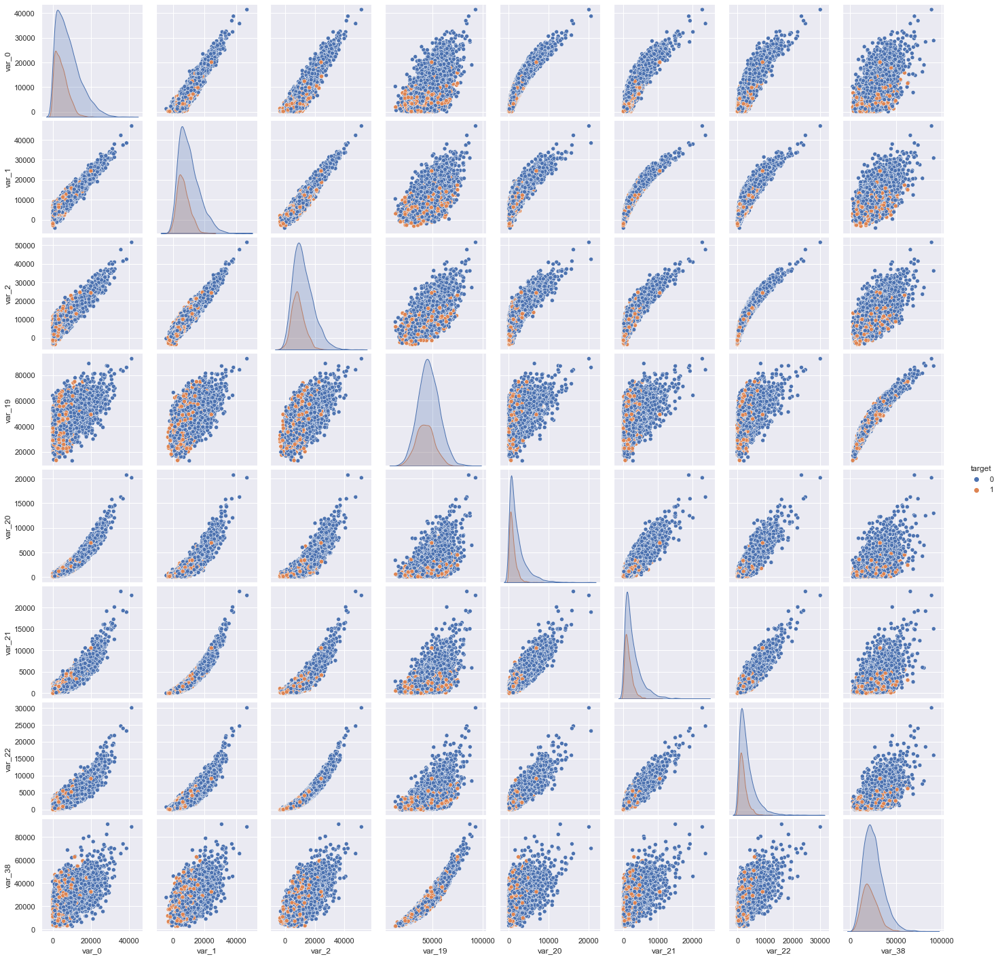

In [31]:
#scatterplot sur 3 premières variables de chaque sous groupe + la dernière + target
sns.set()

var_scatter=['var_0','var_1','var_2','var_19','var_20','var_21','var_22','var_38','target']
sns.pairplot(data[var_scatter], height = 2.5, hue="target")
plt.show()

### Commentaires :
Le scatterplot confirme l'intuition initiale. 
Les variables var_0 à var_19 sont liées,  elles expriment certainement la même chose avec un  décalage temporel.Plus l'écart entre les indices augmentent et moins la relation existe. Il en est de meme pour les variables var_10 à var_38.
Il est également intéressant  de  noter la relation existante entre ces deux sous-groupes. En effet, on pourrait supposer que les var_0 et var_20 (var_1 et var_21, etc...) sont de la même temporalité.
Pour les deux sous-groupes, on peut voir que les histogrammes ont  tendance à se décaler à droite signifiant une tendance baissière (partant du principe de var_0 est la dernière observation et var_19 la première). (Cela pourrait correspondre à un cumul de flux créditeurs/débiteurs)

Par rapport à la variable cible on peut  d'apercevoir qu'il y a une séparation entre les individus aux montants élévés et ceux aux montants faibles car les personnes qui quittent l'entreprise font partie de la première moitié.
Cette observation est encore plus france pour les var à faible indice. (indice  sur le  fait que ce soit les plus récentes)


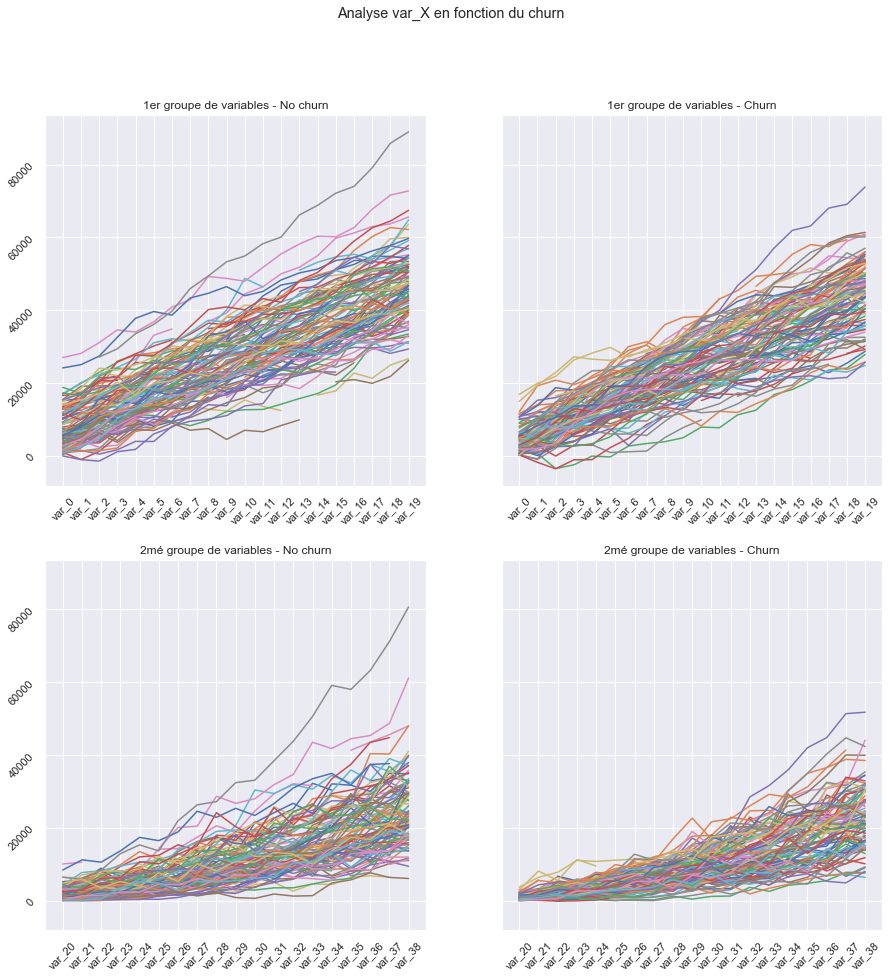

In [32]:
df_set_churn=data[data['target']==1][var_anonyme] #Tirage aléatoire de clients avec churn
df_set_no_churn=data[data['target']==0][var_anonyme] #Tirage aléatoire de clients sans churn

nb_clients=100
fig, axes = plt.subplots(2,2, figsize=(15, 15), sharey=True,sharex=False)
fig.suptitle('Analyse var_X en fonction du churn')

axes[0,0].plot(df_set_no_churn[:nb_clients].transpose()[:20])
axes[0,0].tick_params(labelrotation=45)
axes[0,0].set_title('1er groupe de variables - No churn')

axes[1,0].plot(df_set_no_churn[:nb_clients].transpose()[20:])
axes[1,0].tick_params(labelrotation=45)
axes[1,0].set_title('2mé groupe de variables - No churn')

axes[0,1].plot(df_set_churn[:nb_clients].transpose()[:20])
axes[0,1].tick_params(labelrotation=45)
axes[0,1].set_title('1er groupe de variables - Churn')

axes[1,1].plot(df_set_churn[:nb_clients].transpose()[20:])
axes[1,1].tick_params(labelrotation=45)
axes[1,1].set_title('2mé groupe de variables - Churn')

plt.show()

On peut voir dans la structure que les clients ayant quitté la banque on des valeurs plus petites surtout dans les variables à faibles indices

In [33]:
df_set_churn.describe([0.05,0.25,0.50,0.75,0.90,0.95,0.99])

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38
count,1832.000000,1832.000000,1823.000000,1836.000000,1827.000000,1826.000000,1830.000000,1828.000000,1836.000000,1828.000000,...,1821.000000,1826.000000,1831.000000,1834.000000,1831.000000,1838.000000,1837.000000,1829.000000,1830.000000,1831.000000
mean,4497.834406,6535.621325,8646.306764,10600.130362,12616.840603,14572.246345,16540.771806,18436.968154,20394.224118,22445.704562,...,7949.349807,9157.047858,10474.285072,11740.824621,13136.106214,14657.053963,16165.746620,17890.296871,19698.128987,21504.912226
std,3324.582325,3926.889429,4391.328859,4756.594047,5101.444125,5493.868366,5830.885826,6201.699265,6454.155669,6702.812190,...,3916.495869,4465.344048,4874.594570,5424.270794,5894.203272,6388.395486,6965.182848,7379.258892,7990.971122,8523.687435
min,5.653539,-3258.883503,-3519.347763,-3913.768064,-5409.713059,-1811.097762,-351.274926,-904.308834,-2149.031436,-4337.062922,...,-11.430930,31.496118,51.786562,258.614091,474.166678,1050.553067,1401.075175,1873.985009,3200.683608,2797.950940
5%,317.212873,1050.088961,2295.564116,3561.073609,4699.621834,5709.415257,6970.294985,8487.766213,10094.260993,11265.053391,...,2411.641397,2842.010952,3595.584582,4200.591343,4735.067597,5661.051940,6343.141436,7390.158945,8384.584726,9265.948596
25%,1839.793401,3704.504120,5596.327943,7380.013628,9165.577231,11023.864065,12640.261117,14215.630194,16139.855923,18165.977527,...,5132.740593,5933.554328,6900.715207,7837.454510,8827.481950,10054.123142,11145.247575,12399.658821,13808.162656,15292.028136
50%,3867.227076,6013.724670,8272.133515,10216.578101,12363.523981,14407.133930,16392.512956,18417.018285,20199.303338,22376.221239,...,7437.432434,8479.471660,9886.382558,10971.525081,12395.605393,13849.439580,15300.041798,16879.814523,18584.869436,20566.219384
75%,6541.285462,8983.607533,11255.133523,13625.577051,15811.692937,18118.243700,20289.346762,22516.403901,24706.551319,26941.092495,...,10140.217315,11734.621252,13393.232327,14918.172459,16731.675232,18431.474599,20382.367970,22360.948353,24601.230740,26890.391919
90%,9112.579662,11972.193765,14549.140118,16853.019989,19336.807793,21804.192520,24064.252214,26531.204239,28651.493980,31142.285491,...,13196.065436,15061.638467,16915.738054,19145.433841,20999.522580,23361.243310,25455.299390,27932.782302,30256.087766,32699.933307
95%,10724.189159,13786.832434,16496.044242,19003.791869,21539.353390,23700.266517,26072.510158,28700.351506,31026.459894,33300.133385,...,15121.261891,17395.633768,19279.455795,21512.513277,23728.725732,26750.221834,29063.141555,31111.093935,34271.725371,36058.198463


In [34]:
df_set_no_churn.describe([0.05,0.25,0.50,0.75,0.90,0.95,0.99])

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,...,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38
count,5061.000000,5073.000000,5062.000000,5060.000000,5078.000000,5075.000000,5087.000000,5079.000000,5081.000000,5076.000000,...,5078.000000,5061.000000,5060.000000,5062.000000,5078.000000,5063.000000,5075.000000,5079.000000,5065.000000,5057.000000
mean,8150.882845,10136.570681,12142.524688,14118.228515,16165.578903,18149.887327,20092.961173,22113.708660,24171.232300,26096.256453,...,10444.414079,11758.002626,13167.539649,14610.747143,16122.109727,17784.708216,19560.230779,21284.593067,23203.740308,25225.520678
std,6199.505197,6512.359651,6842.784485,7120.517161,7379.595033,7620.414175,7886.786533,8122.476406,8391.129014,8591.375571,...,5900.425937,6387.255299,6918.927739,7410.069617,7966.108556,8456.875587,9064.644659,9599.237136,10258.582465,10861.806623
min,0.767658,-4241.785944,-3093.478917,-2973.361317,-3584.023848,-3465.351758,-2841.348341,61.076471,-511.453058,2103.878468,...,85.889894,278.753092,440.222182,753.377736,816.913336,1492.241474,1555.119904,1704.972375,1924.631757,2703.861155
5%,679.104609,1787.659610,2835.431708,3969.735569,5371.607571,6902.111696,8522.973494,9852.872781,11178.848761,12658.444642,...,2999.525464,3563.363886,4161.111560,4895.242061,5637.858132,6541.911431,7384.812618,8236.065954,9359.111785,10403.731053
25%,3272.425124,5225.123304,7157.574871,9041.609519,10934.142590,12773.851300,14573.227945,16489.523187,18390.201715,20174.531349,...,6237.256378,7145.593308,8323.329174,9331.789371,10519.105204,11765.269569,13166.633073,14349.058181,15950.877347,17439.033911
50%,6861.967536,8948.897343,11072.295110,13140.755804,15312.945835,17376.899574,19358.929801,21404.028427,23617.380351,25720.076377,...,9426.544441,10704.899134,11971.321301,13370.004032,14819.696831,16488.591122,18177.116006,19970.623897,21789.406550,23805.477715
75%,11658.142197,13894.244101,16179.608195,18348.495886,20727.468726,22950.118511,25058.220039,27149.968102,29557.352396,31523.365985,...,13498.950196,15060.962309,16655.547627,18517.129104,20494.245850,22589.461373,24499.260646,26659.799681,28811.278141,31243.552938
90%,17079.235149,19196.506487,21564.461857,23697.248446,25770.757491,28135.548753,30453.589264,32611.538367,34952.149170,37115.634468,...,17946.893959,20157.339082,22270.437038,24379.264579,26521.504908,28969.230805,31391.195554,33793.681640,36698.725254,39525.745084
95%,20408.970175,22748.283744,24859.665220,27209.201225,29664.803672,31680.245589,33756.979315,36339.455211,38454.679095,40981.535237,...,21169.229871,23562.713256,26109.225936,28510.130594,30847.492900,33108.109375,36005.157007,38405.569052,41759.956105,44779.607950


### Idées pour réduire la redondance d'information 
* ACP
* Construction de features pour chaque client : moyenne, écart type, coefficients d'une régression linéaire, nombre de flux négatifs, etc..

La gestion des valeurs manquantes se fera par interpolation linéaire

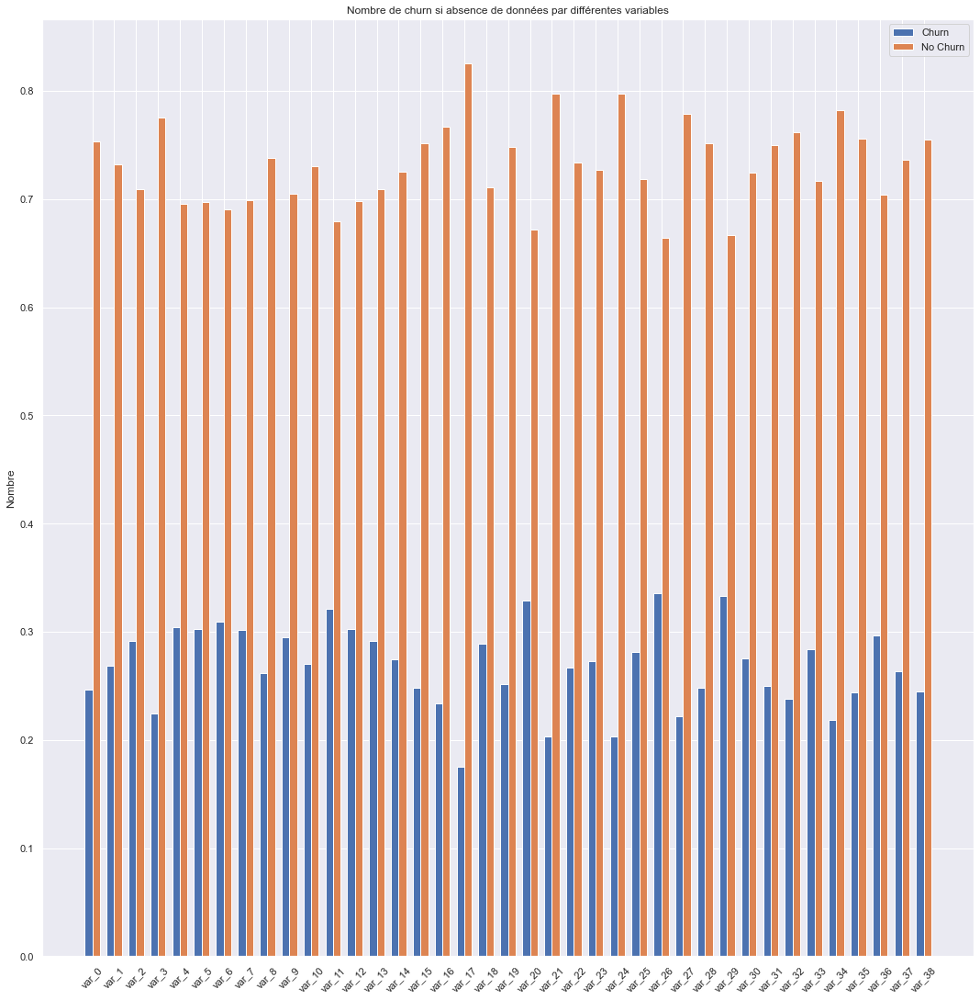

In [35]:
#S'assurer que la présence de valeur manquante ne soit pas discriminant vis à  vis de la target
Oui=[]
Non=[]
for var in var_anonyme:
    dftemp=data[data[var].isna()][target].value_counts()
    if 'oui' in dftemp.index:
        Oui.append(dftemp['oui']/dftemp.sum())
        Non.append(1-dftemp['oui']/dftemp.sum())
    else:
        Oui.append(0)
        Non.append(1)

x = np.arange(len(var_anonyme))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots(figsize=(15, 15))
rects1 = ax.bar(x - width/2, Oui, width, label='Churn')
rects2 = ax.bar(x + width/2, Non, width, label='No Churn')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Nombre')
ax.set_title('Nombre de churn si absence de données par différentes variables')
ax.set_xticks(x)
ax.set_xticklabels(var_anonyme)
ax.legend()


fig.tight_layout()
plt.xticks(rotation=45)
plt.show()    

In [36]:
# La  présence de valeurs manquantes n'est pas discriminante par rapport au Churn

In [37]:
#Imputation par interpolation linéaire

#Traitement des 2 groupes séparément
var_anonyme1=var_anonyme[:20]
var_anonyme2=var_anonyme[20:]

G1=data[var_anonyme1].transpose()
G2=data[var_anonyme2].transpose()

G1=G1.interpolate(method='linear',
               limit=None,limit_direction='both') #Imputer les valeurs aux limites (première et derniére)
G2=G2.interpolate(method='linear',
               limit=None,limit_direction='both')
res=pd.concat([G1,G2])

# On transpose et on redécoupe en 2 sous-groupes
res=res.transpose()
G1=res[var_anonyme1]
G2=res[var_anonyme2]


PCA sur les  2 sous  groupes :

variance expiquée par les PCA
[0.80766242 0.09018335 0.02632024]

valeurs propres
[471.00561542 157.3889847   85.02684664]



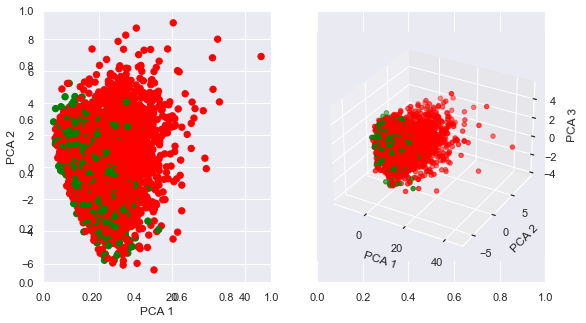

##########################################################################################

PCA sur le 1er sous-groupe  uniquement

variance expiquée par les PCA
[0.83007347 0.09473696 0.02866807]

valeurs propres
[341.94173405 115.519041    63.54671142]



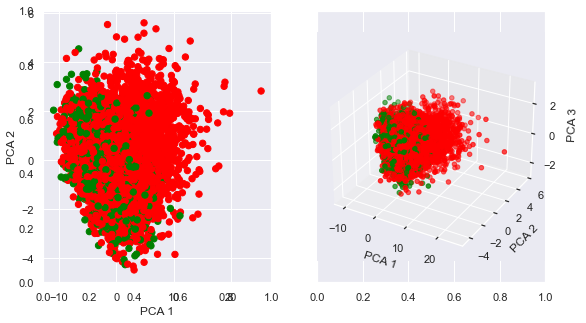

##########################################################################################

PCA sur le 2eme sous-groupe  uniquement

variance expiquée par les PCA
[0.80062931 0.08928898 0.02669022]

valeurs propres
[327.31912846 109.30866393  59.76290934]



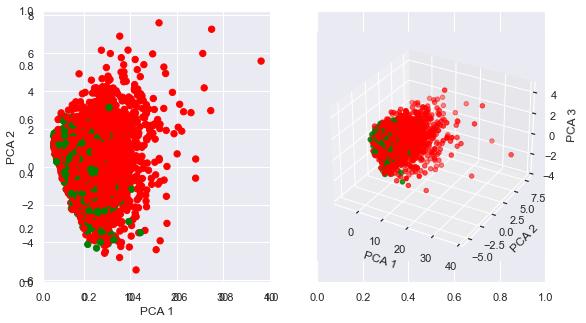

In [38]:
#Affichage PCA pour les 2 sous-groupes, ensembles et sépares
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

scaler=StandardScaler()
testpca=scaler.fit_transform(res)
pca = PCA(n_components=3)
pca.fit(testpca)
new_X=pca.transform(testpca)
pca2=pd.DataFrame(new_X)
pca2['target']=data['target']

print('\033[1m' +'PCA sur les  2 sous  groupes :'+ '\033[0m',end='\n\n') 
print('variance expiquée par les PCA')
print(pca.explained_variance_ratio_,end='\n\n')
print('valeurs propres')
print(pca.singular_values_,end='\n\n')

#Affichage 2D et 3D
colormap=np.array(['Red','green'])
fig, axes = plt.subplots(1,2, figsize=(9, 5), sharey=True,sharex=False)
ax = fig.add_subplot(1, 2, 1)
#axes[0].suptitle('Analyse var_X en fonction du churn')
ax.scatter(pca2[0],pca2[1],c=colormap[data['target']],s=40)
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')

ax = fig.add_subplot(1, 2, 2, projection='3d')
#axes[1] = fig.add_subplot(projection='3d')
ax.scatter(pca2[0], pca2[1], pca2[2], c=colormap[data['target']])
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()

print('######'*15,end='\n\n')

testpca=scaler.fit_transform(G1)
pca = PCA(n_components=3)
pca.fit(testpca)
new_X=pca.transform(testpca)
pca2=pd.DataFrame(new_X)
pca2['target']=data['target']
print('\033[1m' +'PCA sur le 1er sous-groupe  uniquement'+ '\033[0m',end='\n\n')

print('variance expiquée par les PCA')
print(pca.explained_variance_ratio_,end='\n\n')
print('valeurs propres')
print(pca.singular_values_,end='\n\n')

#Affichage 2D et 3D
colormap=np.array(['Red','green'])
fig, axes = plt.subplots(1,2, figsize=(9, 5), sharey=True,sharex=False)
ax = fig.add_subplot(1, 2, 1)
#axes[0].suptitle('Analyse var_X en fonction du churn')
ax.scatter(pca2[0],pca2[1],c=colormap[data['target']],s=40)
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')

ax = fig.add_subplot(1, 2, 2, projection='3d')
#axes[1] = fig.add_subplot(projection='3d')
ax.scatter(pca2[0], pca2[1], pca2[2], c=colormap[data['target']])
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()

print('######'*15,end='\n\n')

testpca=scaler.fit_transform(G2)
pca = PCA(n_components=3)
pca.fit(testpca)
new_X=pca.transform(testpca)
pca2=pd.DataFrame(new_X)
pca2['target']=data['target']
print('\033[1m' +'PCA sur le 2eme sous-groupe  uniquement'+ '\033[0m',end='\n\n')

print('variance expiquée par les PCA')
print(pca.explained_variance_ratio_,end='\n\n')
print('valeurs propres')
print(pca.singular_values_,end='\n\n')

#Affichage 2D et 3D
colormap=np.array(['Red','green'])
fig, axes = plt.subplots(1,2, figsize=(9, 5), sharey=True,sharex=False)
ax = fig.add_subplot(1, 2, 1)
#axes[0].suptitle('Analyse var_X en fonction du churn')
ax.scatter(pca2[0],pca2[1],c=colormap[data['target']],s=40)
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')

ax = fig.add_subplot(1, 2, 2, projection='3d')
#axes[1] = fig.add_subplot(projection='3d')
ax.scatter(pca2[0], pca2[1], pca2[2], c=colormap[data['target']])
ax.set_xlabel('PCA 1')
ax.set_ylabel('PCA 2')
ax.set_zlabel('PCA 3')
plt.show()


In [39]:
def get_pca(df,variance_expliquee=0.95):  
    pca = PCA(n_components=df.shape[1]) 
    #Normalise les données
    scaler=StandardScaler()
    scal_df=scaler.fit_transform(df)
    pca.fit(scal_df)
    lespca=pca.transform(scal_df)
    df_pca=pd.DataFrame(lespca)
    
    #Récupération de la variance expliquée
    explained_variance=pca.explained_variance_ratio_
    cumul_variance=np.cumsum(explained_variance)
    nb_PCA=(cumul_variance<variance_expliquee).sum() #Nombre de PCA nécessaires pour expliquer la variance 
    
    #Plot
    var_nb_PCA=cumul_variance[nb_PCA]
    plt.plot(cumul_variance)
    plt.plot([0, nb_PCA], [var_nb_PCA, var_nb_PCA], "k--",c='red')
    plt.plot([nb_PCA, nb_PCA], [cumul_variance[0], var_nb_PCA], "k--",c='red')
    tol=10**-3
    plt.axis([0, len(explained_variance), cumul_variance[0]-tol, 1+tol])
    plt.xlabel('Nombre de PCA')
    plt.ylabel('Cumul de la variance expliquée')
    plt.show()
    
    return df_pca.iloc[:,:nb_PCA]
    

Variance expliquée en fonction du nombre de PCA : G1



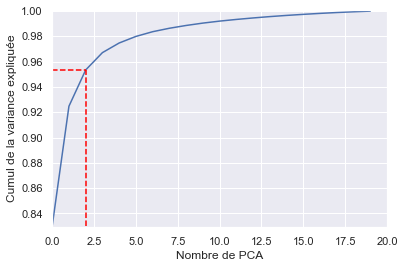

Variance expliquée en fonction du nombre de PCA : G2



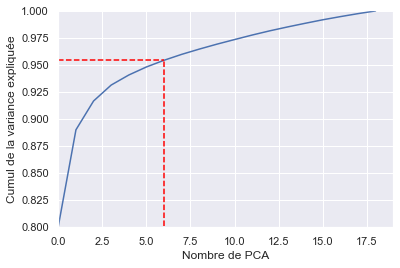

In [40]:
print('Variance expliquée en fonction du nombre de PCA : G1',end='\n\n')
pcaG1=get_pca(G1)
print('Variance expliquée en fonction du nombre de PCA : G2',end='\n\n')
pcaG2=get_pca(G2)

In [41]:
#Changement du nom des colonnes et ajout aux features G1 et G2
name_PCA_G1=['G1_PCA_'+str(i+1) for i in range(pcaG1.shape[1])]
name_PCA_G2=['G2_PCA_'+str(i+1) for i in range(pcaG2.shape[1])]
G1_features=G1.copy()
G2_features=G2.copy()
G1_features[name_PCA_G1]=pcaG1
G2_features[name_PCA_G2]=pcaG2
featuresG1=name_PCA_G1
featuresG2=name_PCA_G2

In [42]:
# Construction de features sur données anonymisés 

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.974
Model:                            OLS   Adj. R-squared:                  0.973
Method:                 Least Squares   F-statistic:                     677.0
Date:                Sun, 27 Mar 2022   Prob (F-statistic):           9.84e-16
Time:                        20:14:06   Log-Likelihood:                -182.68
No. Observations:                  20   AIC:                             369.4
Df Residuals:                      18   BIC:                             371.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        568.7684   1018.139      0.559      0.5

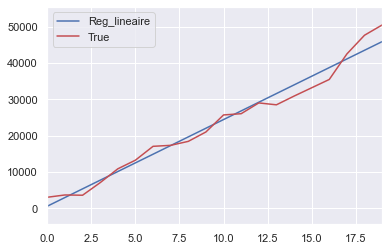

In [43]:
from statsmodels.api import OLS
import numpy
from statsmodels.graphics.regressionplots import abline_plot

client=3
y = G1.iloc[client,:].values
X = numpy.ones((len(y), 2))
X[:,1] = numpy.arange(0,len(y))
reg = OLS(y,X)
results = reg.fit()
print(results.summary())


fig = abline_plot(model_results=results,label='Reg_lineaire')
ax = fig.axes[0]
ax.plot(X[:,1], y, 'r',label='True')
plt.legend()
ax.margins(.1)

In [44]:
def reg_Lineaire(y):
    X = numpy.ones((len(y), 2))
    X[:,1] = numpy.arange(0,len(y))
    reg = OLS(y,X)
    results = reg.fit()
    return pd.Series([results.params[0], results.params[1], results.rsquared])

In [45]:
# Ajout des les coefficients de la régression linéaire + R2 pour chaque série et chaque client

G1_features[["Intercep_1", "Coeff_1", "R2_1"]]=G1_features.apply(
    lambda x: reg_Lineaire(x[var_anonyme1]),
    axis=1
)

G2_features[["Intercep_2", "Coeff_2", "R2_2"]]=G2_features.apply(
    lambda x: reg_Lineaire(x[var_anonyme2]),
    axis=1
)

featuresG1=featuresG1+["Intercep_1", "Coeff_1", "R2_1"]
featuresG2=featuresG2+["Intercep_2", "Coeff_2", "R2_2"]
G2_features



,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,...,var_38,G2_PCA_1,G2_PCA_2,G2_PCA_3,G2_PCA_4,G2_PCA_5,G2_PCA_6,Intercep_2,Coeff_2,R2_2
0,1169.512733,1476.735096,2906.612116,4238.286461,6541.289876,5604.843020,8529.610222,6698.675290,8299.637103,8584.519863,...,23988.305931,-0.888767,0.900178,-0.747499,-0.562339,-0.223212,-0.063162,1165.190146,899.148925,0.823596
1,4040.767255,2893.438448,4522.323311,3289.390612,8409.097755,5939.488953,6615.523133,8423.928612,9664.847859,12811.297554,...,21554.411100,0.951514,1.029797,-0.159172,0.619907,0.024211,0.244642,2081.674713,1059.721183,0.951983
2,641.888116,2194.386006,4719.557270,5592.923372,6652.559765,11578.741807,10784.182742,10408.668590,11426.817452,11686.025962,...,29736.376226,2.774320,-0.445476,-0.925083,-0.784665,-0.874095,0.263467,775.086891,1560.574263,0.975822
3,846.588009,300.647893,462.101281,623.554669,1411.534141,2919.154899,4837.868424,6297.571985,4694.966744,8601.779273,...,29211.314803,-2.215309,-1.034151,-0.006347,-0.214053,0.709458,0.139323,-2972.419241,1289.494934,0.863764
4,533.782193,977.257244,782.571668,1830.376484,2025.910611,2696.413807,2883.741954,4206.610511,4990.114457,7081.966623,...,9101.978017,-3.765296,0.730604,-0.790286,0.501082,-0.026626,-0.140697,511.367359,541.117620,0.819509
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1182.648231,1510.098327,2598.166389,2991.735878,3608.822334,2098.215669,5103.882819,3745.326083,4785.158413,6117.784275,...,14381.020409,-3.007880,0.990664,0.045706,-0.134710,0.044549,-0.343622,176.747196,694.427910,0.850077
7039,2049.427733,4416.815035,4128.218392,6669.065303,9766.783913,7687.555897,7380.477876,9166.937382,13620.864065,11991.782407,...,21706.139987,2.255365,0.747711,-0.352618,-0.176929,-0.561917,-0.351894,2167.716270,1261.238408,0.906903
7040,2532.493621,1792.362493,1180.684063,3545.577293,5910.470524,5049.432877,5962.928289,6003.656914,5667.054344,7813.959981,...,23683.410509,-0.337210,-0.358982,0.585571,-0.400448,0.021359,0.609529,-1496.114442,1367.921039,0.886844
7041,1184.617757,1576.730650,2217.677462,3676.182091,4434.961815,2508.542372,3983.859715,2788.121133,2378.660124,4204.181450,...,13037.292857,-4.234756,1.903689,0.257960,-0.616062,-0.132038,-0.245762,763.049436,400.152342,0.569156


In [46]:
##  Autres Features : 
G1_features['mean_1']=G1.transpose().mean()
G1_features['std_1']=G1.transpose().std()
G1_features['count_neg_1']=(G1.transpose()<0).sum()
G2_features['mean_2']=G2.transpose().mean()
G2_features['std_2']=G2.transpose().std()
G2_features['count_neg_2']=(G2.transpose()<0).sum()

featuresG1=featuresG1+['mean_1','std_1','count_neg_1']
featuresG2=featuresG2+['mean_2','std_2','count_neg_2']

In [47]:
G1_features[featuresG1]

,G1_PCA_1,G1_PCA_2,Intercep_1,Coeff_1,R2_1,mean_1,std_1,count_neg_1
0,-0.995218,0.493776,7328.892152,1769.824024,0.947387,24142.220377,10757.229329,0
1,1.850728,1.596132,14708.804243,1515.836595,0.937964,29109.251893,9259.623601,0
2,3.141542,-0.650780,9967.201744,2331.418719,0.982564,32115.679575,13914.700910,0
3,-1.794036,-1.433996,568.768408,2383.819772,0.974101,23215.056239,14289.116212,0
4,-4.294603,1.528986,6527.739203,1171.540809,0.877280,17657.376887,7399.840181,0
...,...,...,...,...,...,...,...,...
7038,-3.410438,1.383233,5930.453892,1429.173939,0.944450,19507.606315,8700.207205,0
7039,3.046354,1.327722,14805.335933,1754.945879,0.969711,31477.321788,10543.301659,0
7040,0.017850,-0.094010,6873.492842,2038.390989,0.964499,26238.207239,12279.217049,0
7041,-4.849037,2.003018,5749.327674,1147.163550,0.879652,16647.381402,7236.087361,0


In [48]:
all_features_anonymes=pd.concat([G1_features[featuresG1],G2_features[featuresG2]],axis=1)

<AxesSubplot:>

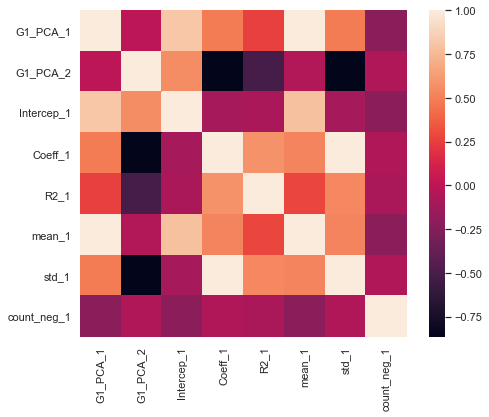

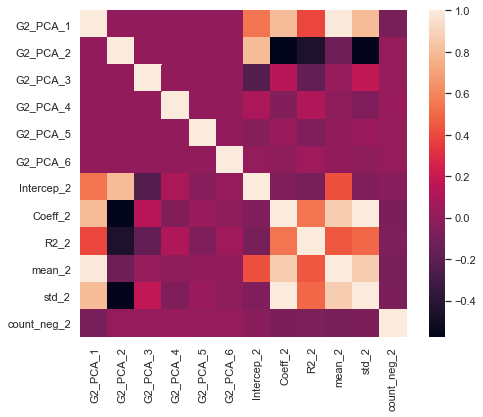

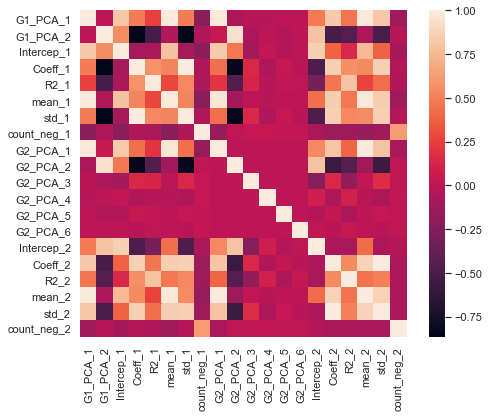

In [49]:
#Correlation des features sur données anonymisées

corr_matrix = G1_features[featuresG1].corr()
ec_corr = corr_matrix.loc[corr_matrix.index,corr_matrix.columns]

f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(ec_corr, mask=np.zeros_like(ec_corr, dtype=np.bool), square=True, ax=ax)

corr_matrix = G2_features[featuresG2].corr()
ec_corr = corr_matrix.loc[corr_matrix.index,corr_matrix.columns]

f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(ec_corr, mask=np.zeros_like(ec_corr, dtype=np.bool), square=True, ax=ax)

corr_matrix = all_features_anonymes.corr()
ec_corr = corr_matrix.loc[corr_matrix.index,corr_matrix.columns]

f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(ec_corr, mask=np.zeros_like(ec_corr, dtype=np.bool), square=True, ax=ax)

In [50]:
ec_corr

,G1_PCA_1,G1_PCA_2,Intercep_1,Coeff_1,R2_1,mean_1,std_1,count_neg_1,G2_PCA_1,G2_PCA_2,G2_PCA_3,G2_PCA_4,G2_PCA_5,G2_PCA_6,Intercep_2,Coeff_2,R2_2,mean_2,std_2,count_neg_2
G1_PCA_1,1.000000e+00,-3.224262e-14,0.822427,0.485617,0.259315,0.998927,0.485852,-0.220272,9.799845e-01,-6.630715e-02,-6.687448e-03,-2.006962e-02,-3.956915e-04,-2.819405e-03,0.475948,0.826085,0.455343,0.979862,0.823874,-0.123401
G1_PCA_2,-3.224262e-14,1.000000e+00,0.562693,-0.864289,-0.515283,-0.045531,-0.862152,-0.058542,4.767472e-02,9.421044e-01,-6.864392e-02,-2.589385e-03,-3.169557e-02,1.651882e-03,0.799157,-0.513055,-0.442982,-0.080812,-0.506144,-0.022252
Intercep_1,8.224268e-01,5.626926e-01,1.000000,-0.097903,-0.082705,0.795225,-0.096468,-0.214498,8.326490e-01,4.711345e-01,-1.062602e-01,1.808566e-02,-2.951079e-02,5.787147e-03,0.856008,0.381638,0.146759,0.759340,0.381210,-0.113792
Coeff_1,4.856168e-01,-8.642890e-01,-0.097903,1.000000,0.580807,0.525547,0.998204,-0.055530,4.349768e-01,-8.394410e-01,1.544078e-01,-6.267520e-02,4.494466e-02,-1.386731e-02,-0.482954,0.858878,0.570242,0.547392,0.855753,-0.040891
R2_1,2.593152e-01,-5.152833e-01,-0.082705,0.580807,1.000000,0.283149,0.536297,-0.081895,2.035977e-01,-4.697797e-01,1.322607e-01,-2.537917e-02,2.378376e-02,1.132081e-02,-0.301365,0.454520,0.798048,0.267610,0.429254,-0.057187
mean_1,9.989271e-01,-4.553088e-02,0.795225,0.525547,0.283149,1.000000,0.525679,-0.217199,9.768137e-01,-1.086629e-01,3.232848e-03,-2.272342e-02,2.154216e-03,-3.501271e-03,0.437542,0.849516,0.472876,0.982632,0.847246,-0.122190
std_1,4.858523e-01,-8.621521e-01,-0.096468,0.998204,0.536297,0.525679,1.000000,-0.050790,4.370442e-01,-8.377962e-01,1.492047e-01,-6.252444e-02,4.475796e-02,-1.478750e-02,-0.479282,0.858834,0.540744,0.549123,0.857604,-0.037876
count_neg_1,-2.202716e-01,-5.854219e-02,-0.214498,-0.055530,-0.081895,-0.217199,-0.050790,1.000000,-1.642643e-01,1.221008e-02,3.350136e-02,4.349242e-02,1.840033e-02,2.879018e-02,-0.083553,-0.136307,-0.126913,-0.164101,-0.135493,0.622198
G2_PCA_1,9.799845e-01,4.767472e-02,0.832649,0.434977,0.203598,0.976814,0.437044,-0.164264,1.000000e+00,-1.550538e-14,-5.553969e-16,-2.689429e-16,3.764515e-17,9.744083e-16,0.540373,0.803838,0.394537,0.990710,0.802326,-0.089877
G2_PCA_2,-6.630715e-02,9.421044e-01,0.471134,-0.839441,-0.469780,-0.108663,-0.837796,0.012210,-1.550538e-14,1.000000e+00,-1.127102e-14,5.005128e-16,-2.039785e-16,-2.442189e-16,0.801952,-0.573565,-0.451920,-0.134432,-0.564051,0.015205


<AxesSubplot:>

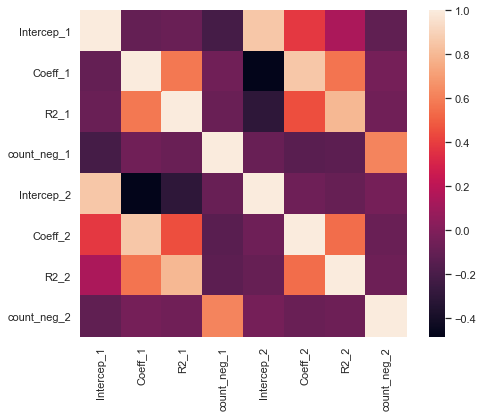

In [51]:
les_col=['Intercep_1','Coeff_1','R2_1','count_neg_1','mean_1','std_1',
        'Intercep_2','Coeff_2','R2_2','count_neg_2','mean_2','std_2']

les_col=['Intercep_1','Coeff_1','R2_1','count_neg_1',
        'Intercep_2','Coeff_2','R2_2','count_neg_2']

corr_matrix = all_features_anonymes[les_col].corr()
ec_corr = corr_matrix.loc[corr_matrix.index,corr_matrix.columns]
f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(ec_corr, mask=np.zeros_like(ec_corr, dtype=np.bool), square=True, ax=ax)

In [52]:
## Forte correlation toujours présente, les PCAs réalisés sur les 2 sous-groupes sont également corrélés.
# Le mieux serait d'appliquer directement une PCA sur l'ensemble des variables anonymes et d'en extraire le nombre qui
# explique 95% de la variance

Variance expliquée en fonction du nombre de PCA :



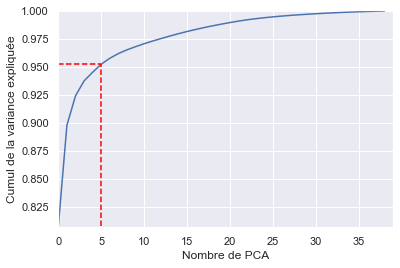

,id_client,genre,espace_client_web,assurance_vie,banque_principale,anciennete_mois,compte_epargne,credit_autres,cartes_bancaires,compte_courant,...,var_38,branche,churn,interet_compte_epargne_total_float,target,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5
0,3463,H,0.0,non,non,37.0,oui,consommation,medium,oui,...,23988.305931,NORD-OUEST,non,3369.25,0,-1.338552,0.977606,-1.089638,-0.850016,0.167164
1,1869,H,0.0,oui,oui,72.0,oui,consommation,premium,inconnu,...,21554.411100,NORD-OUEST,non,1734.65,0,1.995001,1.801463,-0.718442,0.830658,-0.609898
2,3760,H,0.0,non,non,3.0,oui,NaN,medium,non,...,29736.376226,NORD-OUEST,non,232.50,0,4.188007,-0.777032,-1.125453,-0.789997,-0.544616
3,3820,H,1.0,oui,non,72.0,oui,consommation,medium,oui,...,29211.314803,NORD-OUEST,non,8061.50,0,-2.827080,-1.782414,0.029305,-0.597905,0.624129
4,1463,F,0.0,non,non,4.0,oui,permanent,medium,non,...,9101.978017,NORD-OUEST,oui,281.00,1,-5.704338,1.620708,-1.523655,0.565340,0.100752


In [53]:
print('Variance expliquée en fonction du nombre de PCA :',end='\n\n')
pcaG=get_pca(pd.concat([G1,G2],axis=1))
name_PCA=['PCA_'+str(i+1) for i in range(pcaG.shape[1])]
data[name_PCA]=pcaG
data.head()

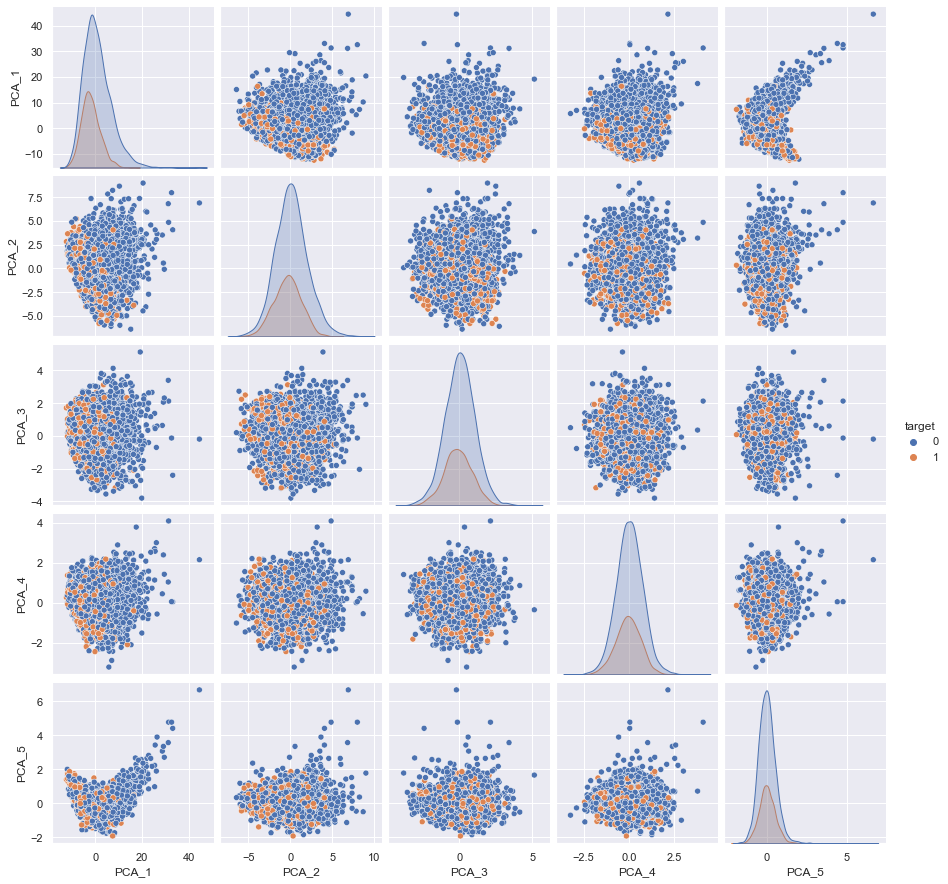

In [54]:
sns.pairplot(data[name_PCA+['target']], height = 2.5, hue="target")
plt.show()

In [55]:
numeric_features=['anciennete_mois','agios_6mois','age','interet_compte_epargne_total_float']+name_PCA
categorical_features=cat
target='target'

In [56]:
ec_corr

,Intercep_1,Coeff_1,R2_1,count_neg_1,Intercep_2,Coeff_2,R2_2,count_neg_2
Intercep_1,1.000000,-0.097903,-0.082705,-0.214498,0.856008,0.381638,0.146759,-0.113792
Coeff_1,-0.097903,1.000000,0.580807,-0.055530,-0.482954,0.858878,0.570242,-0.040891
R2_1,-0.082705,0.580807,1.000000,-0.081895,-0.301365,0.454520,0.798048,-0.057187
count_neg_1,-0.214498,-0.055530,-0.081895,1.000000,-0.083553,-0.136307,-0.126913,0.622198
Intercep_2,0.856008,-0.482954,-0.301365,-0.083553,1.000000,-0.065761,-0.094505,-0.038427
Coeff_2,0.381638,0.858878,0.454520,-0.136307,-0.065761,1.000000,0.542403,-0.079752
R2_2,0.146759,0.570242,0.798048,-0.126913,-0.094505,0.542403,1.000000,-0.071307
count_neg_2,-0.113792,-0.040891,-0.057187,0.622198,-0.038427,-0.079752,-0.071307,1.000000


In [57]:
## Final Matrice de correlations : 

#Verification of features correlation on numerical variables
corr_matrix = data[numeric_features].corr()
ec_corr = corr_matrix.loc[corr_matrix.index,corr_matrix.columns]
sns.heatmap(ec_corr, mask=np.zeros_like(ec_corr, dtype=np.bool), square=True, ax=ax)

<AxesSubplot:>

In [58]:
# Retraitement des données non anonymes pour diminuer la corrélation

In [59]:
#Calcul le montant d'agios moyen par mois
def agios_month(agios,anciennete):
    if anciennete==0:
        return agios
    elif anciennete<6:
        return agios/anciennete
    else:
        return agios/6

In [60]:
data['intérets_mois']=data['interet_compte_epargne_total_float']
data['agios_6mois_mois']=data.apply(
    lambda x: agios_month(x['agios_6mois'],x['anciennete_mois']),
    axis=1
)
data

,id_client,genre,espace_client_web,assurance_vie,banque_principale,anciennete_mois,compte_epargne,credit_autres,cartes_bancaires,compte_courant,...,churn,interet_compte_epargne_total_float,target,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,intérets_mois,agios_6mois_mois
0,3463,H,0.0,non,non,37.0,oui,consommation,medium,oui,...,non,3369.25,0,-1.338552,0.977606,-1.089638,-0.850016,0.167164,3369.25,15.191667
1,1869,H,0.0,oui,oui,72.0,oui,consommation,premium,inconnu,...,non,1734.65,0,1.995001,1.801463,-0.718442,0.830658,-0.609898,1734.65,4.016667
2,3760,H,0.0,non,non,3.0,oui,NaN,medium,non,...,non,232.50,0,4.188007,-0.777032,-1.125453,-0.789997,-0.544616,232.50,24.533333
3,3820,H,1.0,oui,non,72.0,oui,consommation,medium,oui,...,non,8061.50,0,-2.827080,-1.782414,0.029305,-0.597905,0.624129,8061.50,18.816667
4,1463,F,0.0,non,non,4.0,oui,permanent,medium,non,...,oui,281.00,1,-5.704338,1.620708,-1.523655,0.565340,0.100752,281.00,17.600000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,5773,F,0.0,non,non,35.0,oui,permanent,basic,oui,...,non,1982.60,0,-4.543231,1.694316,0.573101,-0.216144,0.020508,1982.60,10.091667
7039,6801,F,0.0,oui,oui,19.0,oui,consommation,medium,non,...,non,1686.85,0,3.761066,1.436978,-0.499729,-0.372189,-0.799926,1686.85,14.891667
7040,3548,H,0.0,non,non,71.0,oui,consommation,medium,oui,...,non,6687.85,0,-0.216154,-0.338535,0.985223,0.102931,-0.272658,6687.85,16.275000
7041,4991,F,0.0,non,non,58.0,oui,permanent,medium,oui,...,oui,6145.85,1,-6.435999,2.763073,0.258718,-0.995569,-0.011356,6145.85,17.741667


In [61]:
numeric_features=['anciennete_mois',
 'agios_6mois_mois',
 'age',
 'intérets_mois',
 'PCA_1',
 'PCA_2',
 'PCA_3',
 'PCA_4',
 'PCA_5']

<AxesSubplot:>

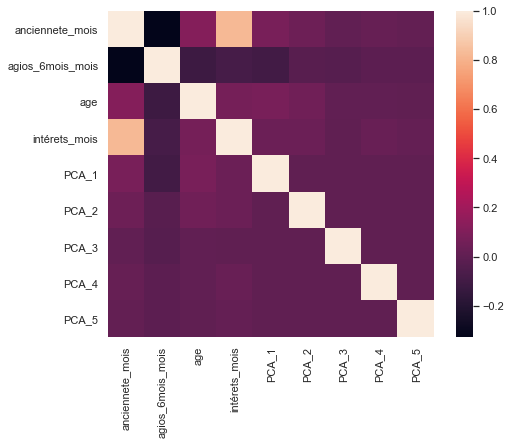

In [62]:
corr_matrix = data[numeric_features].corr()
ec_corr = corr_matrix.loc[corr_matrix.index,corr_matrix.columns]
f, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(ec_corr, mask=np.zeros_like(ec_corr, dtype=np.bool), square=True, ax=ax)

### Partie Modèles :

* Métrique principale : f1-score
* Autres métriques : accuracy, precision, recall
* DataSet non rebalancée
* Preprocessing : 
    * Variable categorielle : imputation par 'Not defined' puis OneHotEncoding
    * Variable numérique : imputation par la moyenne (absence de valeurs aberrantes) puis Standardisation
* Méthodes testées : LogisticRegression, DecisionTree, RandomForest & AdaBoost


In [63]:
## Place aux modèles :

from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.neighbors import NearestNeighbors,KNeighborsClassifier

from sklearn.metrics import accuracy_score,precision_score,roc_auc_score, recall_score,f1_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

In [64]:
#Modification de la feature 'espace_client_web' --> str
data['espace_client_web']=data['espace_client_web'].fillna('Not defined')
data['espace_client_web']=data['espace_client_web'].astype(str)


In [88]:
X=data[numeric_features+categorical_features]
y=data[target]
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 42)
nb_cv=3

In [110]:
import warnings
#Pour ignorer les warnings LogisticRegression penalty ='none' ne prendra pas en compte certains paramètres
warnings.filterwarnings("ignore") 


numeric_transformer = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="mean")),
                                    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
                                    ("imputer", SimpleImputer(strategy="constant", fill_value='Not defined')),
                                    ("onehot", OneHotEncoder(handle_unknown='ignore'))])  

preproc = ColumnTransformer(transformers=[("num", numeric_transformer, numeric_features),
                                          ("cat", categorical_transformer, categorical_features)])

model_list=[]

models = [("tree_clf", DecisionTreeClassifier()),
          ("logreg", LogisticRegression(max_iter=1000,solver='lbfgs',n_jobs= -1)),
          ("rdm_frt", RandomForestClassifier(n_jobs= -1)),
          ("ada", AdaBoostClassifier(base_estimator=DecisionTreeClassifier()))]


grids = {"tree_clf" : {'tree_clf__criterion' : ['gini', 'entropy'], # évaluation de la séparation d'un noeud
                       'tree_clf__max_depth': [4, 6, 8, 12,15], #profondeur maximale de l'arbre
                       'tree_clf__min_samples_split' :[0.01, 0.05, 0.1]}, # proportion minimale au sein d'une feuille
         
         "logreg" : {'logreg__C': np.logspace(-2, 2, 5, base=2), #Critère de régularisation
                     'logreg__penalty': ['l2','none']}, # Pénalité norme ou non
         
         "rdm_frt" : {  'rdm_frt__max_depth': [2, 4,8],#profondeur maximale des arbres
                        'rdm_frt__max_features': ['sqrt','log2'], #Nomnbre de features testées à chaque noeud
                        'rdm_frt__criterion' : ['gini', 'entropy'], # évaluation de la séparation d'un noeud
                        'rdm_frt__min_samples_split': [5,10,0.001], # proportion minimale au sein d'une feuille
                        'rdm_frt__n_estimators': [100, 300, 500]}, #Nombre d'arbre de décision
         
         "ada" : {'ada__n_estimators': [100,200], #Nombre d'itération du weak learner
                  'ada__learning_rate' :[0.1,0.3,0.5,1.0], #learning rate --> prise en compte des erreurs
                  'ada__base_estimator__max_depth':[2,4, 6], #profondeur maximale des arbres
                  'ada__base_estimator__min_samples_leaf' :[5,10,0.001]} # proportion minimale au sein d'une feuille
        }


for name, model in models:
    start_time=time.time()
    pipe = Pipeline(steps=[('preprocessor', preproc), (name, model)])
    clf = GridSearchCV(pipe, grids[name], cv=nb_cv,scoring='f1')
    clf.fit(X_train, y_train)
    model_list.append(clf)
    print('\033[1m' + " Results for {}:".format(name) + '\033[0m')
    print(' Returned hyperparameter: {}'.format(clf.best_params_))
    print(' Best classification F1-score in validation is: {}'.format(round(clf.best_score_,3)))
    print(' F1-score on test is: {}'.format(clf.score(X_test, y_test)),end='\n\n')
    print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))
    print('-----------------------------------------------------',end='\n\n')


 Results for tree_clf:
 Returned hyperparameter: {'tree_clf__criterion': 'gini', 'tree_clf__max_depth': 12, 'tree_clf__min_samples_split': 0.1}
 Best classification F1-score in validation is: 0.708
 F1-score on test is: 0.6882022471910112

--------- 7.04 secondes ---------
-----------------------------------------------------

 Results for logreg:
 Returned hyperparameter: {'logreg__C': 2.0, 'logreg__penalty': 'l2'}
 Best classification F1-score in validation is: 0.766
 F1-score on test is: 0.7464387464387465

--------- 35.49 secondes ---------
-----------------------------------------------------

 Results for rdm_frt:
 Returned hyperparameter: {'rdm_frt__criterion': 'entropy', 'rdm_frt__max_depth': 8, 'rdm_frt__max_features': 'sqrt', 'rdm_frt__min_samples_split': 5, 'rdm_frt__n_estimators': 100}
 Best classification F1-score in validation is: 0.68
 F1-score on test is: 0.6498422712933755

--------- 212.79 secondes ---------
-----------------------------------------------------

 Resu

In [111]:
#Récupérer les paramètres optimaux des méthodes dans le GridSearch: 

dic_model_opt={} #Dictionnaire permettant de stocker les modèles
for i in range(len(models)):
    name_model=models[i][0] #nom du modèle
    le_model=models[i][1] #modèle initiale
    best_params=model_list[i].best_params_ #récupération des paramètres optimaux
    dic_param={} #Dico pour stocker les paramètres
    for i  in best_params:
        dic_param[i[len(name_model)+2:]]=best_params[i]
        le_model.set_params(**dic_param) #Ajout des paramètres
        #Stockage du modèle
        dic_model_opt[name_model]=Pipeline(steps=[('preprocessor', preproc), (name_model, le_model)])

In [112]:
dic_model_opt

{'tree_clf': Pipeline(steps=[('preprocessor',
                  ColumnTransformer(transformers=[('num',
                                                   Pipeline(steps=[('imputer',
                                                                    SimpleImputer()),
                                                                   ('scaler',
                                                                    StandardScaler())]),
                                                   ['anciennete_mois',
                                                    'agios_6mois_mois', 'age',
                                                    'intérets_mois', 'PCA_1',
                                                    'PCA_2', 'PCA_3', 'PCA_4',
                                                    'PCA_5']),
                                                  ('cat',
                                                   Pipeline(steps=[('imputer',
                                                         

Résultats du modèle tree_clf :

                 Train   Test
accuracy_score   86.05  84.24
precision_score  76.26  72.27
recall_score     68.92  65.68
f1_score         72.40  68.82



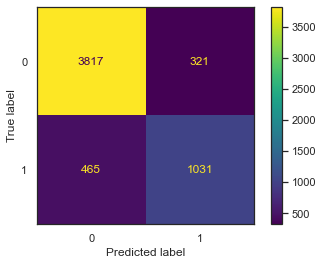

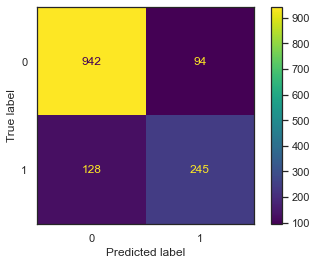

Résultats du modèle logreg :

                 Train   Test
accuracy_score   88.92  87.37
precision_score  83.69  79.64
recall_score     72.39  70.24
f1_score         77.63  74.64



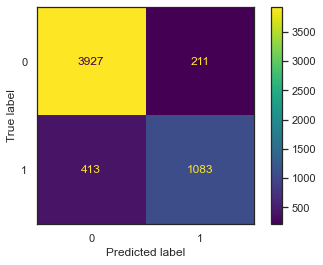

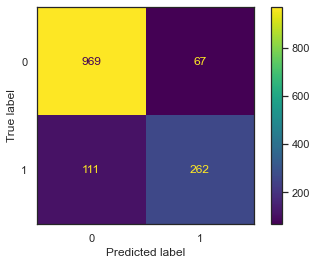

Résultats du modèle rdm_frt :

                 Train   Test
accuracy_score   88.23  83.53
precision_score  87.42  78.54
recall_score     65.04  52.01
f1_score         74.59  62.58



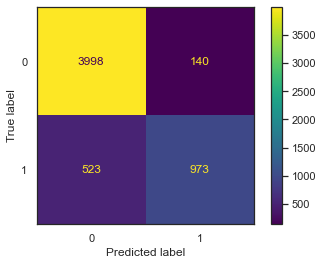

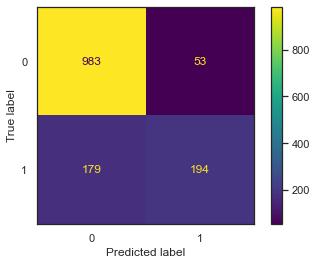

Résultats du modèle ada :

                 Train   Test
accuracy_score   90.27  87.37
precision_score  86.29  79.46
recall_score     75.33  70.51
f1_score         80.44  74.72



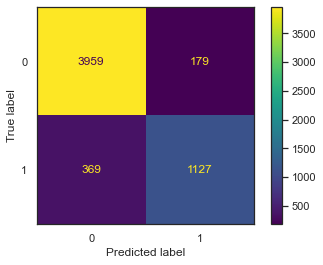

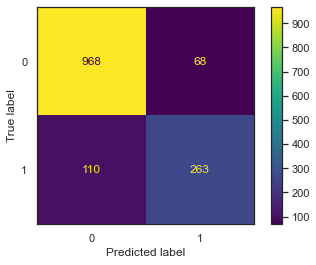

In [113]:
#Fonctions permettant d'afficher des résultats

def metrics_score(y_real,y_pred):
    accuracy = round(accuracy_score(y_real, y_pred),4)
    precision = round(precision_score(y_real, y_pred),4)
    recall = round(recall_score(y_real, y_pred),4)
    f1 = round(f1_score(y_real, y_pred),4)
    return({'accuracy_score' : accuracy*100,
            'precision_score' : precision*100,
            'recall_score' : recall*100,
            'f1_score' : f1*100
           })


def score_model(X_train,X_test,y_train,y_test,model,name_model=None,bool_plot_CM=False):
    sns.set_style('white')
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    dic_train=metrics_score(y_train,y_pred_train)
    dic_test=metrics_score(y_test,y_pred_test) 
    tab_score=pd.DataFrame(dic_train.values(),index=list(dic_train.keys()),columns=['Train'])
    tab_score['Test']=dic_test.values()
    if name_model==None:
        print('\033[1m' +'Résultats du modèle :'+ '\033[0m',end='\n\n')
    else:
        print('\033[1m' +'Résultats du modèle {} :'.format(name_model)+ '\033[0m',end='\n\n')
    print(tab_score,end='\n\n')
    if bool_plot_CM : # Si demande d'affichage  matrice de confusion
        cm_train = confusion_matrix(y_train, y_pred_train, labels=model.classes_)
        disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train,
                               display_labels=model.classes_)
        disp_train.plot()
        cm_test = confusion_matrix(y_test, y_pred_test, labels=model.classes_)
        disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test,
                               display_labels=model.classes_)
        disp_test.plot()
        plt.show()

        
for key, value in dic_model_opt.items():
    value.fit(X_train,y_train)
    score_model(X_train,X_test,y_train,y_test,value,key,True)   

In [114]:
# On récupère les noms des features encodées
name_onehot=dic_model_opt['logreg'].named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features)
all_features=numeric_features+list(name_onehot)

In [115]:
#Visualisation arbre  de décision

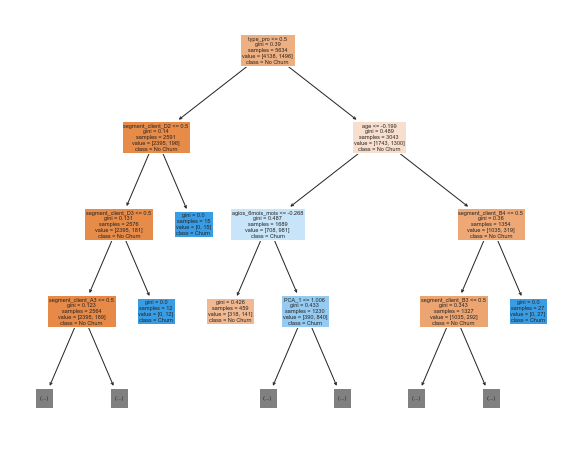

In [116]:
tree_clf=dic_model_opt['tree_clf']
X_transform=tree_clf['preprocessor'].transform(X)
X_transform
fig = plt.figure(figsize=(10,8))
plot_tree(tree_clf['tree_clf'],feature_names=all_features,  class_names=['No Churn','Churn'],max_depth=3,filled=True)
plt.show()


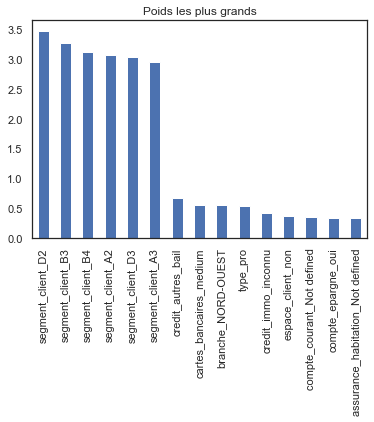

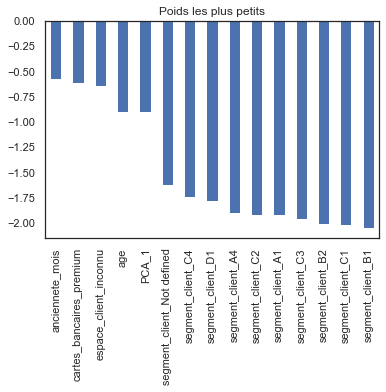

In [117]:
logreg=dic_model_opt['logreg']
weights = pd.Series(logreg['logreg'].coef_[0],
                 index=all_features)
weights.sort_values(ascending = False)[:15].plot(kind='bar')
plt.title('Poids les plus grands')
plt.show()
weights.sort_values(ascending = False)[-15:].plot(kind='bar')
plt.title('Poids les plus petits')
plt.show()

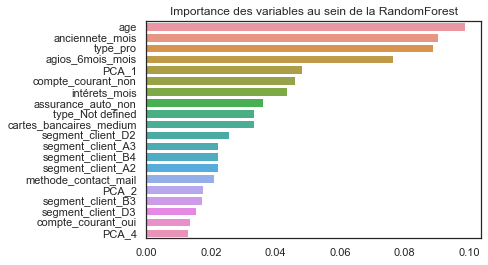

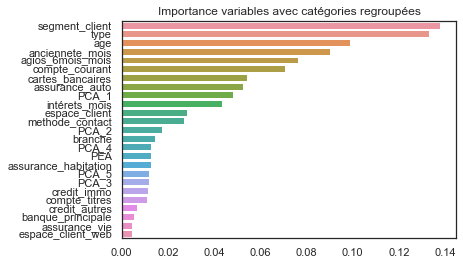

In [118]:
# Features importance RandomForest

rdm_frt=dic_model_opt['rdm_frt'] 
nb_features=20


feature_importances=pd.DataFrame(rdm_frt['rdm_frt'].feature_importances_,index=all_features,columns=['importance'])
feature_importances_sort=feature_importances.sort_values(ascending=False,by=['importance'])[:nb_features].transpose()
sns.barplot(data=feature_importances_sort, orient='h')
plt.title('Importance des variables au sein de la RandomForest')
plt.show()


# On regroupe les variables catégorielles

new_df=pd.DataFrame(columns=numeric_features+categorical_features,index=[1])

for i in numeric_features:
    new_df[i]=feature_importances.loc[i,:].mean()
    

for i in categorical_features:
    count=0
    for j in feature_importances.index:
        if j.startswith(i):
            count+=feature_importances.loc[j,:].mean()
    
    new_df[i]=count

feature_importances_sort_2=new_df[new_df.mean().sort_values(ascending=False).index[:25]]
sns.barplot(data=feature_importances_sort_2, orient='h')
plt.title('Importance variables avec catégories regroupées')
plt.show()

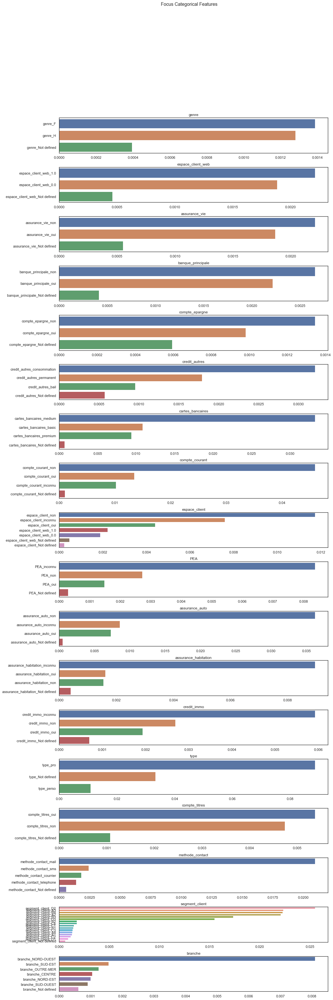

In [119]:
# Zoom sur quelques variables catégorielles

fig, axes = plt.subplots(len(categorical_features),1, figsize=(15, 50), sharey=False)
fig.suptitle('Focus Categorical Features')
#fig.tight_layout()

hspace = 0.4   # the amount of height reserved for white space between subplots

for i in range(len(categorical_features)):
    une_cat=(categorical_features)[i]    
    importance_cat=pd.DataFrame(index=feature_importances.index)

    for j in feature_importances.index:
        if j.startswith(une_cat):
            importance_cat[j]=feature_importances.loc[j,:].mean()
    
    feature_importances_sort_cat=importance_cat[importance_cat.mean().sort_values(ascending=False).index[:20]]
    #sns.barplot(data=feature_importances_sort_country, orient='h')
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=hspace)
    sns.barplot(ax=axes[i], data=feature_importances_sort_cat, orient='h')
    axes[i].set_title(une_cat)
plt.show()

### Essai Voting Classifier

Résultats du modèle VotingClassifier - hard :

                 Train   Test
accuracy_score   89.44  87.58
precision_score  87.57  82.35
recall_score     70.19  67.56
f1_score         77.92  74.23



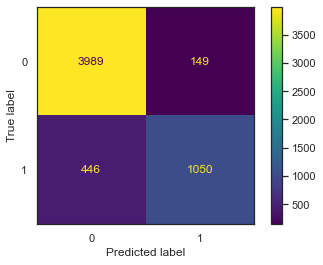

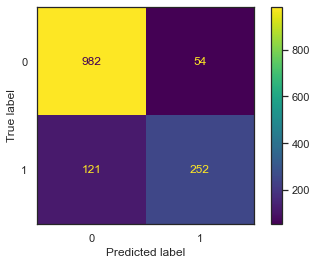

Résultats du modèle VotingClassifier - soft :

                 Train   Test
accuracy_score   88.96  87.37
precision_score  83.77  79.82
recall_score     72.46  69.97
f1_score         77.71  74.57



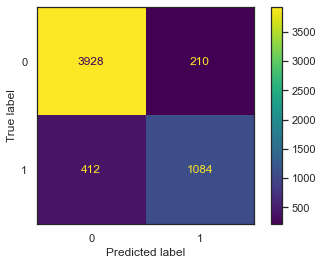

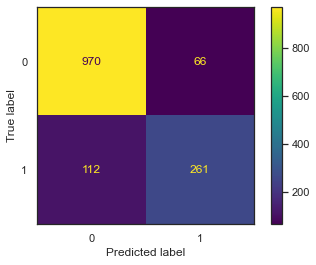

In [122]:
# Essaie Voting Classifier entre LogReg et AdaBoost avec vote "hard" et "soft"

from sklearn.ensemble import  VotingClassifier
ada=dic_model_opt['ada'] 
VotingClassifier_H = VotingClassifier(estimators=[('logreg', logreg), ('ada', ada)], voting='hard')
VotingClassifier_H.fit(X_train,y_train)
score_model(X_train,X_test,y_train,y_test,VotingClassifier_H,'VotingClassifier - hard',True) 

VotingClassifier_S = VotingClassifier(estimators=[('logreg', logreg), ('ada', ada)], voting='soft')
VotingClassifier_S.fit(X_train,y_train)
score_model(X_train,X_test,y_train,y_test,VotingClassifier_S,'VotingClassifier - soft',True) 

In [77]:
### Sortie 

In [140]:
#Predict_Proba sur l'ensemble des observations pour obtenir la probabilité de churn (Score)

data_res=data[['id_client','target','branche']]
data_res['predict']=logreg.predict(X)
data_res[['score_non_churn','score_churn']]=logreg.predict_proba(X)
data_res['erreur']=np.abs(data_res['predict']-data_res['target'])
data_res

,id_client,target,branche,predict,score_non_churn,score_churn,erreur
0,3463,0,NORD-OUEST,1,0.318583,0.681417,1
1,1869,0,NORD-OUEST,0,0.998559,0.001441,0
2,3760,0,NORD-OUEST,0,0.504255,0.495745,0
3,3820,0,NORD-OUEST,0,0.672138,0.327862,0
4,1463,1,NORD-OUEST,1,0.246055,0.753945,0
...,...,...,...,...,...,...,...
7038,5773,0,CENTRE,0,0.964323,0.035677,0
7039,6801,0,CENTRE,0,0.901362,0.098638,0
7040,3548,0,OUTRE-MER,0,0.994030,0.005970,0
7041,4991,1,SUD-OUEST,0,0.968850,0.031150,1


In [141]:
nb_quantil=10
data_res['Quantile_rank'] = pd.qcut(data_res['score_churn'], nb_quantil, 
                           labels = False)

analysis_price = pd.DataFrame({'Mean_churn': data_res.groupby('Quantile_rank').mean()['target'],\
                            'Quantile':data_res.groupby('Quantile_rank').min()['score_churn'],
                            'nb_erreur':data_res.groupby('Quantile_rank').sum()['erreur']})
analysis_price

,Mean_churn,Quantile,nb_erreur
Quantile_rank,,,
0,0.000000,5.785285e-09,0
1,0.005682,3.466549e-03,4
2,0.014205,1.024292e-02,10
3,0.029830,2.260773e-02,21
4,0.049645,4.432752e-02,35
5,0.133523,8.364328e-02,94
6,0.230114,1.609099e-01,162
7,0.434659,3.137205e-01,304
8,0.758523,5.958593e-01,170


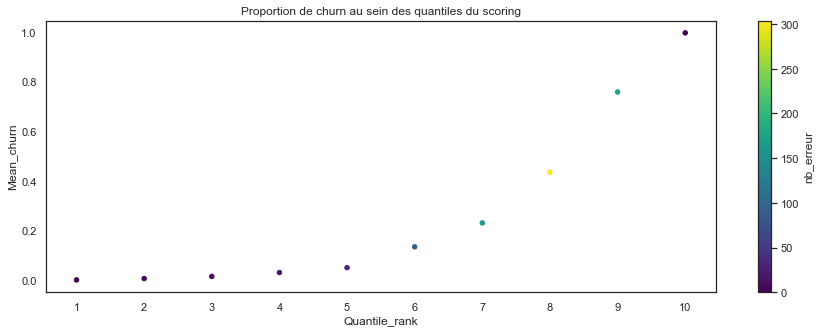

In [142]:
analysis_price.reset_index().plot.scatter(x='Quantile_rank',y='Mean_churn',c='nb_erreur',\
                                 colormap='viridis',title = 'Proportion de churn au sein des quantiles du scoring',figsize=(15,5),sharex=False)
plt.xticks(range(nb_quantil),range(1,nb_quantil+1))
plt.show()

In [147]:
df_liste_priorite=data_res[(data_res['target']==0)&(data_res['score_churn']>=0.6)]\
[['id_client','branche','score_churn']].sort_values(by=['score_churn'],ascending=False)
df_liste_priorite

,id_client,branche,score_churn
4249,5354,NORD-EST,0.967796
630,5307,NORD-OUEST,0.966373
769,4094,NORD-OUEST,0.942205
5983,2238,NORD-EST,0.939132
6207,4648,NORD-OUEST,0.934208
...,...,...,...
3947,5748,CENTRE,0.604274
120,2691,NORD-OUEST,0.602039
3815,3510,CENTRE,0.600879
673,2306,NORD-OUEST,0.600555


In [144]:
# Exportation des clients non churneur avec proba > 60%
df_liste_priorite.to_excel('liste_clients.xlsx')


### Tests autres approches :
* Sur données rebalancées
* Modèle ne prenant pas en compte la variable segment client

In [82]:
# Modèle avec rebalancement du data set
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as Pipeline_imb

In [83]:
# Changement de score : précision pour se focaliser sur les True
sm = SMOTE(random_state=0,n_jobs=-1)

for name, model in models:
    start_time=time.time()
    pipe = Pipeline_imb([
      ("preprocessor", preproc),
      ("o", sm),
      (name, model)])
#    if name=='logreg': #error_score permet pour regression logistic de ne prendre en compte que 
#        # les combinaisons de paramètres qui fonctionnent ensemble
#        clf = GridSearchCV(pipe, grids[name], cv=nb_cv,error_score='raise',scoring='f1') 
#    else:
    clf = GridSearchCV(pipe, grids[name], cv=nb_cv,scoring='f1')
    clf.fit(X_train, y_train)
    model_list.append(clf)
    print('\033[1m' + " Results for {}:".format(name) + '\033[0m')
    print(' Returned hyperparameter: {}'.format(clf.best_params_))
    print(' Best classification F1-score in validation is: {}'.format(round(clf.best_score_,3)))
    print(' F1-score on test is: {}'.format(clf.score(X_test, y_test)),end='\n\n')
    print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))
    print('-----------------------------------------------------',end='\n\n')


 Results for tree_clf:
 Returned hyperparameter: {'tree_clf__criterion': 'gini', 'tree_clf__max_depth': 8, 'tree_clf__min_samples_split': 0.01}
 Best classification F1-score in validation is: 0.692
 F1-score on test is: 0.638184245660881

--------- 14.28 secondes ---------
-----------------------------------------------------

 Results for logreg:
 Returned hyperparameter: {'logreg__C': 0.25, 'logreg__penalty': 'none'}
 Best classification F1-score in validation is: 0.767
 F1-score on test is: 0.752851711026616

--------- 69.05 secondes ---------
-----------------------------------------------------

 Results for rdm_frt:
 Returned hyperparameter: {'rdm_frt__criterion': 'gini', 'rdm_frt__max_depth': 6, 'rdm_frt__max_features': None, 'rdm_frt__min_samples_split': 0.01, 'rdm_frt__n_estimators': 100}
 Best classification F1-score in validation is: 0.708
 F1-score on test is: 0.675544794188862

--------- 728.39 secondes ---------
-----------------------------------------------------

 Resu

## Modèle sans prise en compte de la segmentation client :

In [84]:
# Suppresion de la segmentation client :
categorical_features2=categorical_features.copy()
categorical_features2.remove('segment_client')
categorical_features2

['genre',
 'espace_client_web',
 'assurance_vie',
 'banque_principale',
 'compte_epargne',
 'credit_autres',
 'cartes_bancaires',
 'compte_courant',
 'espace_client',
 'PEA',
 'assurance_auto',
 'assurance_habitation',
 'credit_immo',
 'type',
 'compte_titres',
 'methode_contact',
 'branche']

 Results for tree_clf:
 Returned hyperparameter: {'tree_clf__criterion': 'gini', 'tree_clf__max_depth': 6, 'tree_clf__min_samples_split': 0.1}
 Best F1-score in validation set is: 0.634
 F1-score on test is: 0.6050670640834576

--------- 5.75 secondes ---------
-----------------------------------------------------

 Results for logreg:
 Returned hyperparameter: {'logreg__C': 0.25, 'logreg__penalty': 'l2'}
 Best F1-score in validation set is: 0.69
 F1-score on test is: 0.6461538461538462

--------- 41.53 secondes ---------
-----------------------------------------------------

 Results for rdm_frt:
 Returned hyperparameter: {'rdm_frt__criterion': 'gini', 'rdm_frt__max_depth': 12, 'rdm_frt__max_features': 'sqrt', 'rdm_frt__min_samples_split': 5, 'rdm_frt__n_estimators': 300}
 Best F1-score in validation set is: 0.661
 F1-score on test is: 0.6156202143950996

--------- 254.39 secondes ---------
-----------------------------------------------------

 Results for ada:
 Returned hyperparamet

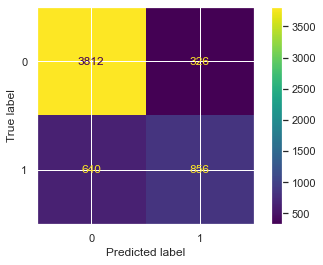

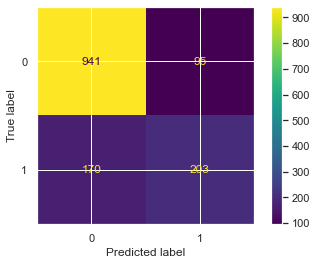

Résultats du modèle logreg :

                 Train   Test
accuracy_score   84.95  82.04
precision_score  74.73  67.54
recall_score     65.44  61.93
f1_score         69.78  64.62



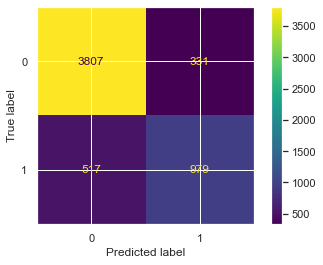

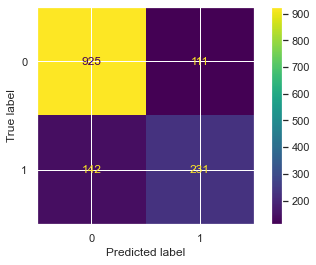

Résultats du modèle rdm_frt :

                 Train   Test
accuracy_score   95.49  81.55
precision_score  94.68  69.96
recall_score     87.97  53.08
f1_score         91.20  60.37



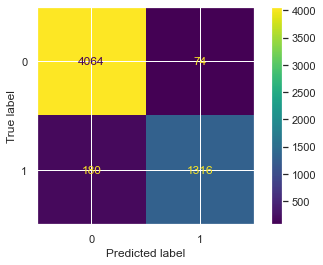

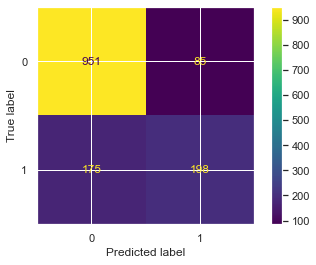

Résultats du modèle ada :

                 Train   Test
accuracy_score   85.36  81.90
precision_score  74.65  67.35
recall_score     67.91  61.39
f1_score         71.12  64.24



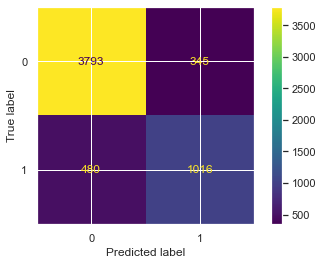

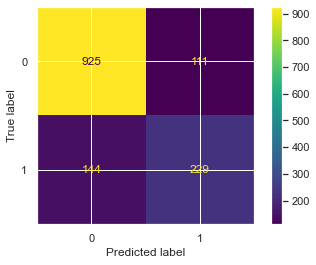

Coefficients issus de la Régression Logistique :



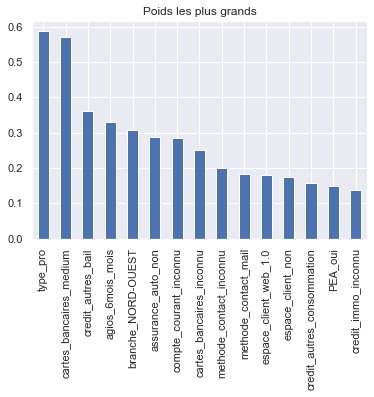

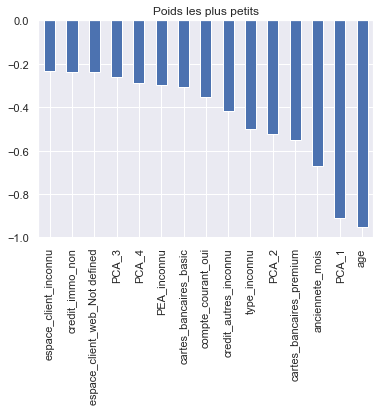

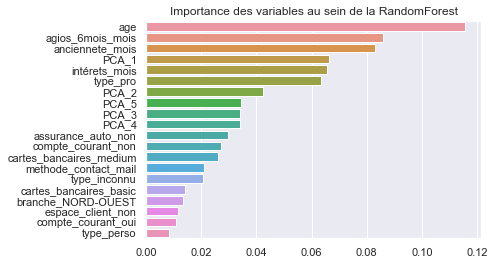

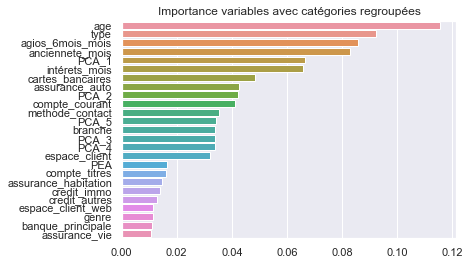

In [85]:
X=data[numeric_features+categorical_features2]
y=data[target]
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state = 42)
nb_cv=3

import warnings
#Pour ignorer les warnings LogisticRegression penalty ='none' ne prendra pas en compte certains autres paramètres
warnings.filterwarnings("ignore") 


numeric_transformer = Pipeline(steps=[
                                    ("imputer",SimpleImputer(strategy="mean")),
                                    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[
                                    ("imputer", SimpleImputer(strategy="constant", fill_value="inconnu")),
                                    ("onehot", OneHotEncoder(handle_unknown='ignore'))])  

preproc = ColumnTransformer(transformers=[("num", numeric_transformer, numeric_features),
                                          ("cat", categorical_transformer, categorical_features2)])

model_list=[]

models = [("tree_clf", DecisionTreeClassifier()),
          ("logreg", LogisticRegression(max_iter=500,solver='saga',n_jobs= -1)),
          ("rdm_frt", RandomForestClassifier(n_jobs= -1)),
          ("ada", AdaBoostClassifier(base_estimator=DecisionTreeClassifier()))]


grids = {"tree_clf" : {'tree_clf__criterion' : ['gini', 'entropy'],
                       'tree_clf__max_depth': [4, 6, 8, 12,15],
                       'tree_clf__min_samples_split' :[0.01, 0.05, 0.1]},
         
         "logreg" : {'logreg__C': np.logspace(-2, 2, 5, base=2),
#                    'logreg__penalty': ['l1', 'l2', 'elasticnet', 'none']},
                     'logreg__penalty': ['l2','none']},
         
         "rdm_frt" : {  'rdm_frt__max_depth': [4, 8, 12],
                        'rdm_frt__max_features': ['sqrt','log2'],
                        'rdm_frt__criterion' : ['gini', 'entropy'],
                        'rdm_frt__max_features': ['sqrt','log2'],
                        'rdm_frt__min_samples_split': [2, 5, 10],
                        'rdm_frt__n_estimators': [100, 300, 500]},
         
         "ada" : {'ada__n_estimators': [100,200],
                  'ada__learning_rate' :[0.3,0.5,1.0],
                  'ada__base_estimator__max_depth':[i for i in range(1,6,2)],
                  'ada__base_estimator__min_samples_leaf' :[0.05,0.1]} 
        }


for name, model in models:
    start_time=time.time()
    pipe = Pipeline(steps=[('preprocessor', preproc), (name, model)])
    if name=='logreg': #error_score permet pour regression logistic de ne prendre en compte que 
        # les combinaisons de paramètres qui fonctionnent ensemble
        clf = GridSearchCV(pipe, grids[name], cv=nb_cv,error_score='raise',scoring='f1') 
    else:
        clf = GridSearchCV(pipe, grids[name], cv=nb_cv,scoring='f1')
    clf.fit(X_train, y_train)
    model_list.append(clf)
    print('\033[1m' + " Results for {}:".format(name) + '\033[0m')
    print(' Returned hyperparameter: {}'.format(clf.best_params_))
    print(' Best F1-score in validation set is: {}'.format(round(clf.best_score_,3)))
    print(' F1-score on test is: {}'.format(clf.score(X_test, y_test)),end='\n\n')
    print("--------- %s secondes ---------" % (round(time.time() - start_time,2)))
    print('-----------------------------------------------------',end='\n\n')

    
#Récupérer les paramètres optimaux des méthodes : 
dic_model_opt={} #Dictionnaire permettant de stocker les modèles
for i in range(len(models)):
    name_model=models[i][0] #nom du modèle
    le_model=models[i][1] #modèle initiale
    best_params=model_list[i].best_params_ #récupération des paramètres optimaux
    dic_param={} #Dico pour stocker les paramètres
    for i  in best_params:
        dic_param[i[len(name_model)+2:]]=best_params[i]
        le_model.set_params(**dic_param) #Ajout des paramètres
        #Stockage du modèle
        dic_model_opt[name_model]=Pipeline(steps=[('preprocessor', preproc), (name_model, le_model)])
        
for key, value in dic_model_opt.items():
    value.fit(X_train,y_train)
    score_model(X_train,X_test,y_train,y_test,value,key,True)  
    
# On récupère les noms des features encodées
name_onehot=dic_model_opt['logreg'].named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features2)
all_features=numeric_features+list(name_onehot)

print('Coefficients issus de la Régression Logistique :',end='\n\n')
logreg=dic_model_opt['logreg']
weights = pd.Series(logreg['logreg'].coef_[0],
                 index=all_features)
weights.sort_values(ascending = False)[:15].plot(kind='bar')
plt.title('Poids les plus grands')
plt.show()
weights.sort_values(ascending = False)[-15:].plot(kind='bar')
plt.title('Poids les plus petits')
plt.show()


# Features importance RandomForest

rdm_frt=dic_model_opt['rdm_frt'] 
nb_features=20


feature_importances=pd.DataFrame(rdm_frt['rdm_frt'].feature_importances_,index=all_features,columns=['importance'])
feature_importances_sort=feature_importances.sort_values(ascending=False,by=['importance'])[:nb_features].transpose()
sns.barplot(data=feature_importances_sort, orient='h')
plt.title('Importance des variables au sein de la RandomForest')
plt.show()


# On regroupe les variables catégorielles

new_df=pd.DataFrame(columns=numeric_features+categorical_features2,index=[1])

for i in numeric_features:
    new_df[i]=feature_importances.loc[i,:].mean()
    

for i in categorical_features2:
    count=0
    for j in feature_importances.index:
        if j.startswith(i):
            count+=feature_importances.loc[j,:].mean()
    
    new_df[i]=count

feature_importances_sort_2=new_df[new_df.mean().sort_values(ascending=False).index[:25]]
sns.barplot(data=feature_importances_sort_2, orient='h')
plt.title('Importance variables avec catégories regroupées')
plt.show()

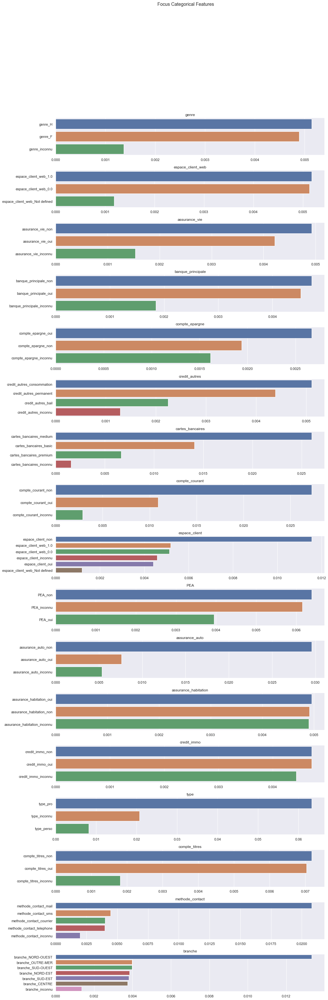

In [86]:
 # Zoom sur quelques variables catégorielles

fig, axes = plt.subplots(len(categorical_features2),1, figsize=(15, 50), sharey=False)
fig.suptitle('Focus Categorical Features')
#fig.tight_layout()

hspace = 0.4   # the amount of height reserved for white space between subplots

for i in range(len(categorical_features2)):
    une_cat=(categorical_features2)[i]    
    importance_cat=pd.DataFrame(index=feature_importances.index)

    for j in feature_importances.index:
        if j.startswith(une_cat):
            importance_cat[j]=feature_importances.loc[j,:].mean()
    
    feature_importances_sort_cat=importance_cat[importance_cat.mean().sort_values(ascending=False).index[:20]]
    #sns.barplot(data=feature_importances_sort_country, orient='h')
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=hspace)
    sns.barplot(ax=axes[i], data=feature_importances_sort_cat, orient='h')
    axes[i].set_title(une_cat)
plt.show()